# RT-DETR-L Training

## Config and Paths

In [1]:
import os

DATASET_YAML = '/home/achin/COS40007-Group/dataset/dataset.yaml'
WEIGHTS_PATH = '/home/achin/COS40007-Group/rtdetr-l.pt'
PROJECT_DIR  = '/home/achin/COS40007-Group/runs/defect_detection'
DATASET_ROOT = '/home/achin/COS40007-Group/dataset'

CLASS_NAMES = ['crack', 'pothole', 'wall_peeling']
BACKGROUND_PREFIXES = ('wall-', 'road-')
NC = 3
RUN = 'rtdetr_l_v7'
SPLITS = ['train', 'val', 'test']

IMAGE_DIRS = {s: os.path.join(DATASET_ROOT, s, 'images') for s in SPLITS}
LABEL_DIRS = {s: os.path.join(DATASET_ROOT, s, 'labels') for s in SPLITS}

print("Paths configured:")
for s in SPLITS:
    all_imgs = [f for f in os.listdir(IMAGE_DIRS[s]) if f.endswith('.jpg')]
    bg_imgs  = [f for f in all_imgs if f.startswith(BACKGROUND_PREFIXES)]
    def_imgs = [f for f in all_imgs if not f.startswith(BACKGROUND_PREFIXES)]
    print(f"  {s}: {len(def_imgs)} defect + {len(bg_imgs)} background = {len(all_imgs)} total")

Paths configured:
  train: 462 defect + 79 background = 541 total
  val: 99 defect + 18 background = 117 total
  test: 99 defect + 18 background = 117 total


## Dataset Exploratory Data Analysis


TRAIN: 546 images
  crack: 164 annotations
  pothole: 398 annotations
  wall_peeling: 233 annotations
  background (empty): 84 images
  bg/defect ratio: 0.11 ✅

VAL: 117 images
  crack: 34 annotations
  pothole: 82 annotations
  wall_peeling: 49 annotations
  background (empty): 18 images
  bg/defect ratio: 0.11 ✅

TEST: 117 images
  crack: 36 annotations
  pothole: 65 annotations
  wall_peeling: 47 annotations
  background (empty): 18 images
  bg/defect ratio: 0.12 ✅


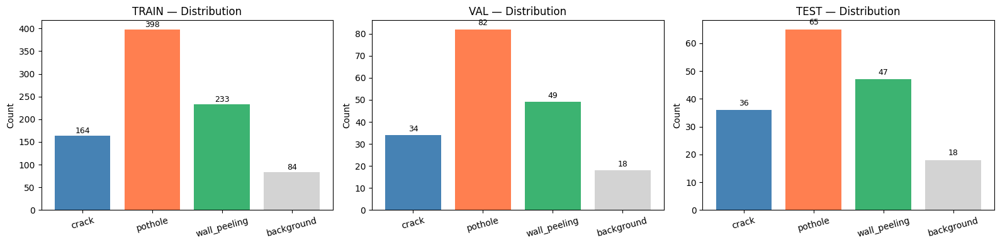

In [2]:
import os
from pathlib import Path
from collections import Counter
import matplotlib.pyplot as plt

def count_images(directory):
    p = Path(directory)
    return len(list(p.glob('*.jpg')) + list(p.glob('*.jpeg')))

def count_labels(split):
    label_dir = Path(LABEL_DIRS[split])
    class_counts = Counter()
    bg_count = 0
    for txt in label_dir.glob('*.txt'):
        content = txt.read_text().strip()
        if not content:
            bg_count += 1
        else:
            for line in content.splitlines():
                if line.strip():
                    cls = int(line.split()[0])
                    class_counts[cls] += 1
    return class_counts, bg_count

for split in SPLITS:
    counts, bg_count = count_labels(split)
    total_images = count_images(IMAGE_DIRS[split])
    print(f"\n{split.upper()}: {total_images} images")
    for cls_id in sorted(counts):
        print(f"  {CLASS_NAMES[cls_id]}: {counts[cls_id]} annotations")
    print(f"  background (empty): {bg_count} images")
    ratio = bg_count / max(sum(counts.values()), 1)
    print(f"  bg/defect ratio: {ratio:.2f} {'⚠️ consider reducing' if ratio > 0.5 else '✅'}")

# Bar chart — defect classes only, background shown separately
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, split in zip(axes, SPLITS):
    counts, bg_count = count_labels(split)
    names  = [CLASS_NAMES[i] for i in sorted(counts)] + ['background']
    values = [counts[i] for i in sorted(counts)] + [bg_count]
    colors = ['steelblue', 'coral', 'mediumseagreen', 'lightgray']
    bars = ax.bar(names, values, color=colors)
    ax.set_title(f'{split.upper()} — Distribution')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=15)
    for bar, val in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                str(val), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig(os.path.join(PROJECT_DIR, 'class_distribution.png'), dpi=150)
plt.show()

## Visualise Sample Annotations

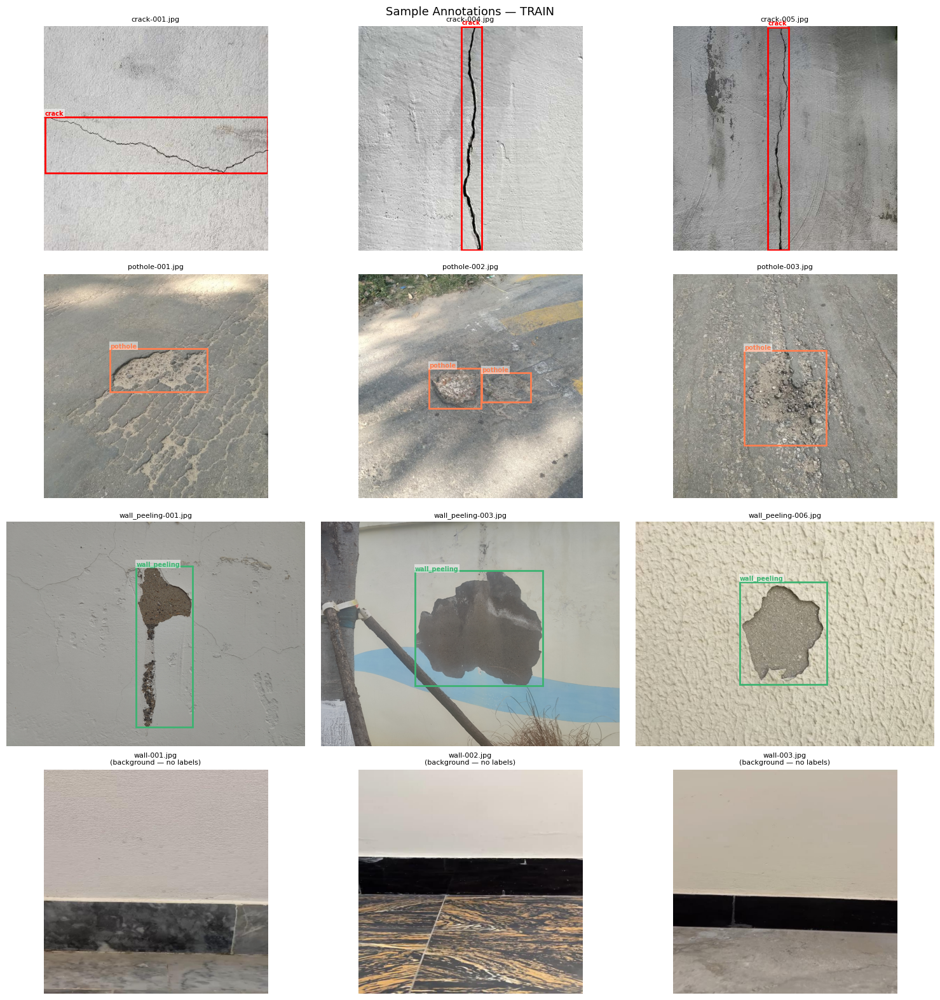

In [3]:
import matplotlib.patches as patches
from PIL import Image

def visualize_samples_by_class(split, n_per_class=3):
    img_dir = Path(IMAGE_DIRS[split])
    lbl_dir = Path(LABEL_DIRS[split])
    COLORS  = ['red', 'coral', 'mediumseagreen']

    # defect rows + 1 background row
    total_rows = NC + 1
    fig, axes = plt.subplots(total_rows, n_per_class, figsize=(5 * n_per_class, 4 * total_rows))

    # --- defect class rows ---
    for row, cls_name in enumerate(CLASS_NAMES):
        cls_imgs = sorted(img_dir.glob(f'{cls_name}-*.jpg'))[:n_per_class]

        for col in range(n_per_class):
            ax = axes[row][col]
            ax.axis('off')

            if col >= len(cls_imgs):
                ax.set_title(f'{cls_name} — no sample', fontsize=9)
                continue

            img_path = cls_imgs[col]
            img = Image.open(img_path).convert('RGB')
            w, h = img.size
            ax.imshow(img)
            ax.set_title(f'{img_path.name}', fontsize=8)

            lbl_path = lbl_dir / (img_path.stem + '.txt')
            if lbl_path.exists():
                for line in lbl_path.read_text().strip().splitlines():
                    parts = line.split()
                    if not parts:
                        continue
                    c, cx, cy, bw, bh = int(parts[0]), float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                    x1 = (cx - bw/2) * w
                    y1 = (cy - bh/2) * h
                    rect = patches.Rectangle(
                        (x1, y1), bw*w, bh*h,
                        linewidth=2, edgecolor=COLORS[c % len(COLORS)], facecolor='none'
                    )
                    ax.add_patch(rect)
                    ax.text(x1, y1 - 4, CLASS_NAMES[c], color=COLORS[c % len(COLORS)],
                            fontsize=7, fontweight='bold',
                            bbox=dict(facecolor='white', alpha=0.5, pad=1, edgecolor='none'))

    bg_imgs = []
    for prefix in BACKGROUND_PREFIXES:
        bg_imgs.extend(sorted(img_dir.glob(f'{prefix}*.jpg')))
    bg_imgs = bg_imgs[:n_per_class]

    for col in range(n_per_class):
        ax = axes[NC][col]
        ax.axis('off')
        if col < len(bg_imgs):
            img = Image.open(bg_imgs[col]).convert('RGB')
            ax.imshow(img)
            ax.set_title(f'{bg_imgs[col].name}\n(background — no labels)', fontsize=8)
        else:
            ax.set_title('background — no sample', fontsize=9)

    plt.suptitle(f'Sample Annotations — {split.upper()}', fontsize=13)
    plt.tight_layout()
    plt.savefig(os.path.join(PROJECT_DIR, f'sample_annotations_{split}.png'), dpi=150)
    plt.show()

visualize_samples_by_class('train', n_per_class=3)

## Iterative Training — Setup

In [4]:
from pathlib import Path

for split in SPLITS:
    cache = Path(LABEL_DIRS[split]).parent / 'labels.cache'
    if cache.exists():
        cache.unlink()
        print(f"Deleted cache: {cache}")
    else:
        print(f"No cache found for {split} — OK")

Deleted cache: /home/achin/COS40007-Group/dataset/train/labels.cache
Deleted cache: /home/achin/COS40007-Group/dataset/val/labels.cache
No cache found for test — OK


In [5]:
from pathlib import Path
import random

SEED = 42
SPLIT_DIR = Path('/home/achin/COS40007-Group/dataset/splits')
SPLIT_DIR.mkdir(parents=True, exist_ok=True)

# Cumulative train sizes for the 6 iterations
ITER_TRAIN_SIZES = [400, 428, 456, 484, 512, 541]


def make_splits(force: bool = True):
    """Generate per-iteration train lists + fixed val/test lists, deterministically.

    Writes:
      dataset/splits/iter{0..5}_train.txt  (cumulative train image paths)
      dataset/splits/val.txt               (184 paths, fixed)
      dataset/splits/test.txt              (181 paths, fixed)

    Idempotent: skips files that already exist unless `force=True`.
    Seed=42 => the same 400-image baseline + same batch order every run.
    """
    train_imgs = sorted(
        p for p in (Path(DATASET_ROOT) / 'train' / 'images').glob('*.jpg')
    )
    rng = random.Random(SEED)
    rng.shuffle(train_imgs)

    written = []
    for n, cum in enumerate(ITER_TRAIN_SIZES):
        out = SPLIT_DIR / f'iter{n}_train.txt'
        if out.exists() and not force:
            continue
        subset = train_imgs[:cum]
        out.write_text('\n'.join(str(p) for p in subset) + '\n', encoding='utf-8')
        written.append(str(out))

    for split in ('val', 'test'):
        out = SPLIT_DIR / f'{split}.txt'
        if out.exists() and not force:
            continue
        files = sorted((Path(DATASET_ROOT) / split / 'images').glob('*.jpg'))
        out.write_text('\n'.join(str(p) for p in files) + '\n', encoding='utf-8')
        written.append(str(out))

    print(f'make_splits: wrote {len(written)} files into {SPLIT_DIR}')
    for p in written:
        print(f'  {p}')


make_splits()


make_splits: wrote 8 files into /home/achin/COS40007-Group/dataset/splits
  /home/achin/COS40007-Group/dataset/splits/iter0_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter1_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter2_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter3_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter4_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter5_train.txt
  /home/achin/COS40007-Group/dataset/splits/val.txt
  /home/achin/COS40007-Group/dataset/splits/test.txt


In [6]:
def write_iter_data_yaml(n: int) -> str:
    """Emit dataset/dataset_iter{n}.yaml pointing train/val/test at the per-iter .txt files.

    Ultralytics accepts a .txt path under `train:` (one image path per line) so the
    iter loop can grow the train set without touching the underlying image directories.
    Returns the YAML path as a string.
    """
    p = Path(f'/home/achin/COS40007-Group/dataset/dataset_iter{n}.yaml')
    p.write_text(
        f"train: /home/achin/COS40007-Group/dataset/splits/iter{n}_train.txt\n"
        f"val:   /home/achin/COS40007-Group/dataset/splits/val.txt\n"
        f"test:  /home/achin/COS40007-Group/dataset/splits/test.txt\n"
        f"nc: {NC}\n"
        f"names: {CLASS_NAMES}\n",
        encoding='utf-8',
    )
    return str(p)


print(f'write_iter_data_yaml ready (caller passes n in 0..{len(ITER_TRAIN_SIZES) - 1})')


write_iter_data_yaml ready (caller passes n in 0..5)


In [7]:
from ultralytics import RTDETR
import json
import time
import random as _random
from pathlib import Path
import pandas as pd
from PIL import Image as _PILImage

iterlog_path = Path(PROJECT_DIR) / f'{RUN}_iterlog.csv'
if not iterlog_path.exists():
    iterlog_path.write_text(
        'iter,cum_train_imgs,new_imgs,mAP50,mAP50_95,precision,recall,'
        'pct_iou_gt_0_5,pct_iou_gt_0_9,best_epoch,time_h,notes\n',
        encoding='utf-8',
    )

stop_flag = Path(PROJECT_DIR) / 'STOP'
final_iter = None  # tracks the last successfully completed iter


def _read_first_xywh(label_path: Path):
    """Read the first YOLO-format normalized xywh box from a .txt. Returns None if absent."""
    if not label_path.exists():
        return None
    for line in label_path.read_text(encoding='utf-8').splitlines():
        parts = line.split()
        if not parts:
            continue
        try:
            return (float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4]))
        except (ValueError, IndexError):
            continue
    return None


def _iou_xywh(box_a, box_b, w, h):
    """IoU between two normalized xywh boxes given image dims (w, h)."""
    ax1 = (box_a[0] - box_a[2] / 2) * w
    ay1 = (box_a[1] - box_a[3] / 2) * h
    ax2 = (box_a[0] + box_a[2] / 2) * w
    ay2 = (box_a[1] + box_a[3] / 2) * h
    bx1 = (box_b[0] - box_b[2] / 2) * w
    by1 = (box_b[1] - box_b[3] / 2) * h
    bx2 = (box_b[0] + box_b[2] / 2) * w
    by2 = (box_b[1] + box_b[3] / 2) * h
    inter_x1 = max(ax1, bx1); inter_y1 = max(ay1, by1)
    inter_x2 = min(ax2, bx2); inter_y2 = min(ay2, by2)
    inter = max(0.0, inter_x2 - inter_x1) * max(0.0, inter_y2 - inter_y1)
    area_a = max(0.0, ax2 - ax1) * max(0.0, ay2 - ay1)
    area_b = max(0.0, bx2 - bx1) * max(0.0, by2 - by1)
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0


def _iterlog_has_row(path: Path, n: int) -> bool:
    if not path.exists():
        return False
    for line in path.read_text(encoding='utf-8').splitlines()[1:]:
        if line.startswith(f'{n},'):
            return True
    return False


for n in range(len(ITER_TRAIN_SIZES)):
    cum = ITER_TRAIN_SIZES[n]
    new = cum - (ITER_TRAIN_SIZES[n-1] if n > 0 else 0)
    run_name = f'{RUN}_iter{n}'
    run_dir = Path(PROJECT_DIR) / run_name

    last_pt = run_dir / 'weights' / 'last.pt'
    if last_pt.exists() and _iterlog_has_row(iterlog_path, n):
        print(f'iter {n}: already complete (last.pt + iterlog row present), skipping')
        final_iter = n
        continue

    if stop_flag.exists():
        print(f'STOP sentinel present, exiting at iter {n}')
        break

    data_yaml = write_iter_data_yaml(n)
    if n == 0:
        model = RTDETR(WEIGHTS_PATH)
    else:
        prev_last = Path(PROJECT_DIR) / f'{RUN}_iter{n-1}' / 'weights' / 'last.pt'
        if not prev_last.exists():
            print(f'iter {n}: previous last.pt missing at {prev_last}; aborting')
            break
        model = RTDETR(str(prev_last))
    train_kwargs = dict(
        data=data_yaml,
        epochs=50, imgsz=640, batch=8,
        workers=4, amp=True, device=0,
        project=PROJECT_DIR, name=run_name, exist_ok=True,
        optimizer='AdamW', lr0=1e-4, lrf=0.001, weight_decay=1e-4,
        warmup_epochs=5, warmup_bias_lr=0.1, patience=50,
        hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,
        fliplr=0.5, flipud=0.1, scale=0.5,
        mosaic=1.0, copy_paste=0.3, degrees=10.0, translate=0.1,
        save=True, plots=True,
    )

    t0 = time.time()
    print(f'\n=== iter {n}: training ({cum} train images, {new} new) ===')
    model.train(**train_kwargs)
    t_h = (time.time() - t0) / 3600.0

    # Val for mAP50 + per-class
    val = model.val(data=data_yaml, split='val', plots=False, save_json=False, verbose=False)
    map50 = float(val.box.map50); map50_95 = float(val.box.map)
    P = float(val.box.mp); R = float(val.box.mr)
    per_class = [float(x) for x in val.box.ap50]

    # Per-test-image IoU
    test_files = [Path(l) for l in SPLIT_DIR.joinpath('test.txt').read_text(encoding='utf-8').splitlines() if l.strip()]
    preds = model.predict(source=[str(p) for p in test_files], conf=0.001, save=False, verbose=False)
    iou_rows = []
    for img_p, r in zip(test_files, preds):
        with _PILImage.open(img_p) as im:
            w, h = im.size
        gt_n = _read_first_xywh(Path('/home/achin/COS40007-Group/dataset/test/labels') / (img_p.stem + '.txt'))
        if len(r.boxes) > 0:
            conf = float(r.boxes.conf[0])
            pred_xyxy = r.boxes.xyxy[0].cpu().numpy().tolist()
            pred_n = ((pred_xyxy[0]+pred_xyxy[2])/(2*w),
                      (pred_xyxy[1]+pred_xyxy[3])/(2*h),
                      (pred_xyxy[2]-pred_xyxy[0])/w,
                      (pred_xyxy[3]-pred_xyxy[1])/h)
        else:
            conf = 0.0; pred_xyxy = None; pred_n = None
        if gt_n is not None and pred_n is not None:
            iou = _iou_xywh(gt_n, pred_n, w, h)
            gt_xyxy = [(gt_n[0]-gt_n[2]/2)*w, (gt_n[1]-gt_n[3]/2)*h,
                       (gt_n[0]+gt_n[2]/2)*w, (gt_n[1]+gt_n[3]/2)*h]
        else:
            iou = 0.0; gt_xyxy = None
        iou_rows.append({
            'image': img_p.name, 'conf': conf,
            'pred_xyxy': pred_xyxy, 'gt_xyxy': gt_xyxy, 'iou': iou,
        })
    iou_csv = Path(PROJECT_DIR) / f'{run_name}_test_iou.csv'
    pd.DataFrame(iou_rows).to_csv(iou_csv, index=False)
    ious = [row['iou'] for row in iou_rows]
    pct_5 = sum(1 for i in ious if i > 0.5) / max(len(ious), 1)
    pct_9 = sum(1 for i in ious if i > 0.9) / max(len(ious), 1)

    # 2 sample images (random pick from test set)
    sample_dir = Path(PROJECT_DIR) / f'{run_name}_samples'
    sample_dir.mkdir(exist_ok=True)
    _random.seed(SEED + n)  # reproducible per-iter sample
    sample_imgs = _random.sample(test_files, min(2, len(test_files)))
    model.predict(source=[str(p) for p in sample_imgs], conf=0.25, save=True,
                  project=str(sample_dir), name='.', exist_ok=True)

    # Best epoch from results.csv
    best_epoch = ''
    res_csv = run_dir / 'results.csv'
    if res_csv.exists():
        try:
            res = pd.read_csv(res_csv)
            best_epoch = int(res['metrics/mAP50(B)'].idxmax()) + 1
        except Exception:
            pass

    # Per-iter summary JSON
    summary = {
        'iter': n, 'cum_train_imgs': cum, 'new_imgs': new,
        'mAP50': map50, 'mAP50_95': map50_95, 'precision': P, 'recall': R,
        'pct_iou_gt_0_5': pct_5, 'pct_iou_gt_0_9': pct_9,
        'best_epoch': best_epoch, 'time_h': t_h,
        'per_class_ap50': dict(zip(CLASS_NAMES, per_class)),
    }
    summary_path = Path(PROJECT_DIR) / f'{run_name}_summary.json'
    summary_path.write_text(json.dumps(summary, indent=2), encoding='utf-8')

    # Append iterlog row
    with iterlog_path.open('a', encoding='utf-8') as f:
        f.write(f'{n},{cum},{new},{map50:.4f},{map50_95:.4f},{P:.4f},{R:.4f},'
                f'{pct_5:.4f},{pct_9:.4f},{best_epoch},{t_h:.2f},\n')

    print(f'iter {n} done: mAP50={map50:.4f} %IoU>0.5={pct_5:.3f} time={t_h:.2f}h')

    final_iter = n
    if map50 >= 0.85:
        stop_flag.touch()
        print(f'iter {n} hit mAP50 >= 0.85; STOP sentinel written')
        break

print(f'\nFinal completed iter: {final_iter}')



=== iter 0: training (400 train images, 400 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter0.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/rtdetr-l.pt, momentum=0.937, mosaic=1.0, multi_sc

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)
Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter0/labels.jpg... 
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter0
Starting training for 50 epochs...

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       1/50      21.5G      1.557      13.49     0.9607          8       1280: 0% ──────────── 0/50  7.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      21.7G      1.949      4.055      1.727          8       1280: 100% ━━━━━━━━━━━━ 50/50 1.8it/s 27.7s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 2.6it/s 3.1s0.1ss
                   all        117        165   0.000171     0.0732   0.000132   4.36e-05

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       2/50      21.7G       1.43     0.5735       1.12          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      21.8G      1.307     0.6569      0.868          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.8s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165    0.00104      0.276    0.00121   0.000297

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       3/50      21.9G      1.248     0.7595     0.6489          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      21.9G      1.121     0.8571     0.7102          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.1s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165    0.00406      0.285    0.00395    0.00129

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       4/50        22G     0.9446      1.092     0.4968          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50        22G      1.048     0.9449     0.6507          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.3s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.6it/s 0.5s.2s
                   all        117        165    0.00178      0.455    0.00624    0.00213

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       5/50      22.1G     0.7425      1.228     0.3259          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      22.1G     0.8521      1.157     0.5109          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.3s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.7it/s 0.5s.2s
                   all        117        165    0.00735      0.443    0.00927    0.00311

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       6/50      22.2G      0.615      1.392     0.3226          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      22.2G     0.7472      1.282      0.422          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165    0.00235      0.561      0.023    0.00892

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       7/50      22.3G     0.7281      1.277     0.3642          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      22.3G     0.7203      1.328     0.3858          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165    0.00277       0.57     0.0432     0.0148

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/50      22.4G     0.5146      1.604     0.2217          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      22.4G     0.6517      1.423     0.3638          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.2s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.337      0.562     0.0362     0.0159

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/50      22.5G     0.6802      1.485     0.2875          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      22.6G     0.6721      1.353     0.3583          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165      0.352      0.327      0.039     0.0176

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      10/50      22.7G     0.4504      1.702     0.2549          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      22.7G     0.6021      1.425     0.3223          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.7it/s 0.5s.2s
                   all        117        165      0.673       0.26     0.0539     0.0231

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      11/50      22.8G     0.4741      1.566     0.2749          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      22.8G     0.6072      1.423     0.3314          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.6it/s 0.5s.2s
                   all        117        165      0.674      0.211     0.0407     0.0228

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      12/50      22.9G     0.6695      1.329     0.2988          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      22.9G     0.5846       1.43     0.3158          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.3s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.4it/s 0.6s.2s
                   all        117        165      0.675       0.15     0.0316     0.0186

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      13/50      22.9G     0.7121      1.222     0.3085          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50        23G     0.5541      1.454     0.3009          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165      0.351      0.214      0.034     0.0168

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      14/50      23.1G     0.3895      1.601      0.182          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      23.1G     0.5772       1.44     0.3208          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.6s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.4it/s 0.6s.2s
                   all        117        165      0.534      0.186     0.0426     0.0203

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      15/50      23.2G     0.4418      1.498     0.1456          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      23.2G     0.5538      1.422     0.3078          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.1s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.346      0.239      0.057      0.025

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      16/50      23.3G     0.7097      1.322     0.5836          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      23.3G     0.5808      1.384     0.3356          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.3s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.347      0.222     0.0545     0.0321

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      17/50      23.4G     0.7311      1.213     0.3731          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      23.4G     0.5465       1.43     0.3089          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.2s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165      0.347      0.195     0.0483     0.0263

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      18/50      23.5G     0.3688      1.519     0.1423          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      23.6G     0.5336      1.418     0.2993          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s.2s
                   all        117        165      0.348      0.252     0.0335     0.0153

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      19/50      23.7G     0.4979      1.353     0.2399          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      23.9G      0.544       1.41     0.3116          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.2s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.352      0.251     0.0331     0.0195

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      20/50        24G     0.5057      1.445     0.3006          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      24.2G     0.5248      1.429     0.3038          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.2s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165       0.35      0.167     0.0401     0.0187

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      21/50      24.2G     0.6045      1.451     0.3934          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      24.5G     0.4775      1.476     0.2908          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165      0.352      0.121     0.0371     0.0141

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      22/50      24.6G     0.4778      1.415     0.2663          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      24.6G     0.5343      1.417     0.3314          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.0s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.353      0.178     0.0244      0.011

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      23/50      24.7G     0.3358      1.514     0.1919          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      24.9G     0.5031      1.448     0.2961          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.2s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.354      0.122     0.0235     0.0112

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      24/50        25G      0.525      1.478     0.3749          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50        25G     0.5361      1.394     0.3572          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.1s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165     0.0193      0.142     0.0239     0.0111

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      25/50      25.1G     0.4445      1.535     0.1715          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      25.3G     0.5052      1.441     0.3105          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.6s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s.2s
                   all        117        165     0.0233       0.15     0.0309     0.0118

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      26/50      25.5G     0.4944      1.656      0.353          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      25.7G      0.537      1.423     0.3475          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.1s
                   all        117        165     0.0255      0.145     0.0182    0.00899

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      27/50      25.8G     0.4893      1.374      0.332          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      25.8G     0.4894      1.456     0.2926          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.2s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.1s
                   all        117        165     0.0191      0.159     0.0175    0.00842

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      28/50      25.9G     0.4995      1.453     0.3108          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      26.1G     0.5147      1.425      0.328          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.1s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.355       0.11     0.0189    0.00898

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      29/50      26.1G     0.5086      1.414     0.2876          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      26.4G      0.539      1.421     0.3694          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.4it/s 0.6s.2s
                   all        117        165     0.0205      0.183     0.0252    0.00903

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      30/50      26.5G     0.5277      1.336     0.4067          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      26.5G     0.5215      1.449     0.3644          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.6s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165     0.0259      0.171     0.0339     0.0118

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      31/50      26.6G     0.5781      1.194     0.2969          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      26.8G     0.4956      1.448     0.3176          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s.2s
                   all        117        165     0.0196       0.22     0.0324     0.0111

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      32/50      26.9G     0.5379      1.452     0.5611          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      27.1G     0.4879       1.44       0.32          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.1s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165     0.0153      0.232     0.0241    0.00971

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      33/50      27.2G     0.5114      1.451     0.3225          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      27.4G     0.4972      1.475     0.3381          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.1s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165     0.0166      0.183     0.0254    0.00908

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      34/50      27.6G     0.4141      1.422     0.2377          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      27.6G     0.5242      1.424     0.3524          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165     0.0207      0.153     0.0173    0.00777

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      35/50      27.7G      0.626      1.215     0.2859          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      27.9G     0.4977      1.455     0.3156          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.2s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165     0.0226       0.15     0.0314     0.0109

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      36/50        28G     0.5493      1.491      0.433          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50        28G     0.5159      1.451     0.3467          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.1s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.6it/s 0.6s.2s
                   all        117        165     0.0234       0.14      0.022    0.00927

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      37/50      28.1G     0.3963      1.696     0.3461          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      28.3G     0.4582       1.47     0.2863          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.1s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.4it/s 0.6s.2s
                   all        117        165     0.0198      0.182     0.0312     0.0126

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      38/50      28.4G     0.4073      1.596     0.1864          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      28.6G     0.4695        1.5     0.3163          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.019      0.174     0.0239     0.0103

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      39/50      28.7G     0.3377      1.542     0.2112          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      28.8G     0.5035      1.446     0.3393          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.2s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165      0.024      0.157     0.0235     0.0105

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      40/50      28.9G     0.3282      1.475     0.1407          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      29.1G     0.4789       1.46     0.3188          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165     0.0176      0.116      0.022     0.0104
Closing dataloader mosaic

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      41/50      29.2G     0.3241      2.317     0.4709          8        640: 0% ──────────── 0/50  3.7s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      29.2G     0.4147      2.242     0.5235          8        640: 100% ━━━━━━━━━━━━ 50/50 3.5it/s 14.2s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s.2s
                   all        117        165       0.35     0.0706      0.015    0.00705

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      42/50      29.3G     0.3665       2.25     0.2233          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      29.3G     0.3525      1.957     0.3715          8        640: 100% ━━━━━━━━━━━━ 50/50 4.8it/s 10.5s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165      0.345      0.133     0.0215    0.00817

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      43/50      29.4G     0.6357      1.444     0.5097          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      29.4G     0.3608      1.861     0.3281          8        640: 100% ━━━━━━━━━━━━ 50/50 4.7it/s 10.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.344      0.171     0.0179    0.00698

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      44/50      29.5G     0.3137      1.764     0.4898          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      29.5G     0.3227      1.881     0.2685          8        640: 100% ━━━━━━━━━━━━ 50/50 4.7it/s 10.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s.2s
                   all        117        165       0.35      0.197     0.0205    0.00862

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      45/50      29.6G     0.4603      1.908     0.4272          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      29.6G     0.3125      1.902     0.2851          8        640: 100% ━━━━━━━━━━━━ 50/50 4.7it/s 10.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.8it/s 0.6s.1s
                   all        117        165      0.355     0.0854     0.0264     0.0105

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      46/50      29.8G     0.2617      2.013     0.2645          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      29.8G     0.2654      1.982     0.2311          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.9s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.1s
                   all        117        165      0.356      0.103     0.0383     0.0152

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      47/50      29.9G     0.2258      2.061     0.1816          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      29.9G     0.2961      1.987     0.2758          8        640: 100% ━━━━━━━━━━━━ 50/50 4.7it/s 10.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s.2s
                   all        117        165      0.353      0.122     0.0293      0.012

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      48/50        30G     0.1581      2.265     0.1236          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50        30G     0.2739      1.983     0.2098          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.9s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.351      0.156     0.0436     0.0159

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      49/50        30G     0.2769      1.884     0.1613          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      30.1G     0.2851      1.955     0.2264          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s.2s
                   all        117        165      0.352      0.145     0.0401     0.0154

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      50/50      30.2G     0.3983      1.922     0.3874          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      30.2G     0.2742      1.974     0.2647          8        640: 100% ━━━━━━━━━━━━ 50/50 4.9it/s 10.3s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.352      0.137     0.0407     0.0156

50 epochs completed in 0.273 hours.
Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter0/weights/last.pt, 66.2MB
Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter0/weights/best.pt, 66.2MB

Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter0/weights/best.pt...
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.3it/s 1.

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 7.5it/s 1.1s0.1s
                   all        117        165      0.347      0.218     0.0493     0.0281
Speed: 0.5ms preprocess, 6.3ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter0_samples
iter 0 done: mAP50=0.0493 %IoU>0.5=0.427 time=0.28h

=== iter 1: training (450 train images, 50 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter1.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=Fa

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)
Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter1/labels.jpg... 
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter1
Starting training for 50 epochs...

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       1/50      20.8G     0.6489      1.179     0.3247          8       1280: 0% ──────────── 0/57  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      20.8G      1.857     0.4218      1.363          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.1it/s 27.1s0.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.4it/s 0.6s.2s
                   all        117        165          0          0          0          0

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       2/50      20.8G      2.055     0.3151     0.8854          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      20.8G      1.542     0.5315     0.9451          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165    0.00177      0.335     0.0145    0.00496

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       3/50      20.8G      1.678     0.4491      1.379          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      20.8G      1.407     0.6183     0.7735          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.1s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165     0.0118      0.324    0.00907    0.00163

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       4/50      20.8G      1.126     0.7774     0.6747          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      20.8G      1.116     0.8317     0.5939          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.1s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165     0.0104      0.514      0.029    0.00847

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       5/50      20.8G      1.254     0.7474     0.8033          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      20.8G      1.083      0.862     0.5317          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.1s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.343      0.331     0.0436     0.0102

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       6/50      20.8G      1.106     0.8326     0.6053          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      20.8G      1.046     0.8797     0.5091          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.1s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s.2s
                   all        117        165    0.00946      0.651     0.0456     0.0148

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       7/50      20.8G        0.8      1.018     0.3628          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      20.8G     0.9024     0.9788     0.4845          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s.2s
                   all        117        165     0.0295      0.331     0.0463      0.017

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/50      20.8G      0.767      1.135     0.5465          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      20.8G     0.9466      0.955     0.4464          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.8s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.354      0.228     0.0371    0.00923

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/50      20.8G     0.9025     0.9533     0.3108          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      20.8G     0.8141      1.051     0.4177          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.4it/s 0.6s.1s
                   all        117        165     0.0296      0.383      0.044     0.0156

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      10/50      20.8G     0.8604      1.015     0.4316          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      20.8G     0.8116      1.038     0.4047          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.8s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165       0.37      0.134     0.0548     0.0178

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      11/50      20.8G     0.6224      1.107     0.3913          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      20.8G     0.7843      1.086     0.4108          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.368       0.14     0.0559     0.0203

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      12/50      20.8G     0.8518      1.044      0.391          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      20.8G     0.7699      1.087     0.3598          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.8s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.8it/s 0.6s.2s
                   all        117        165      0.377      0.254      0.057     0.0188

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      13/50      20.8G      1.026     0.9722     0.5723          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      20.8G     0.7483      1.118     0.3853          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.9s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s.2s
                   all        117        165      0.399      0.188     0.0573     0.0209

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      14/50      20.8G     0.5162      1.289     0.3212          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      20.8G     0.6995      1.137      0.359          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.0s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.391      0.155     0.0596     0.0238

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      15/50      20.8G     0.8657     0.9639     0.4008          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      20.8G     0.7429      1.097     0.3342          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165      0.392      0.165     0.0565     0.0209

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      16/50      20.8G      0.626      1.219     0.2739          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      20.8G     0.6697      1.134     0.3077          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.1s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.432       0.21      0.064     0.0232

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      17/50      20.8G     0.6372      1.087      0.317          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      20.8G     0.6865      1.149     0.3244          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.0s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.1it/s 0.7s.2s
                   all        117        165      0.378      0.174     0.0552     0.0195

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      18/50      20.8G     0.5219      1.383     0.3207          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      20.8G     0.6197       1.21     0.2979          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.9s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s.2s
                   all        117        165      0.397      0.149     0.0657     0.0236

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      19/50      20.8G     0.7733      1.109     0.2775          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      20.8G      0.658      1.155     0.2857          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.9s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165      0.707     0.0935     0.0721      0.028

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      20/50      20.8G     0.4942      1.378     0.2213          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      20.8G     0.6088      1.221      0.297          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.0s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165      0.379      0.198     0.0678     0.0226

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      21/50      20.8G     0.7691     0.9606     0.2162          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      20.8G     0.6329      1.176     0.2928          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.6s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.442      0.148     0.0606     0.0258

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      22/50      20.8G      0.729      1.243     0.3325          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      20.8G     0.5572      1.287     0.2587          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.9s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165      0.435       0.22      0.079     0.0321

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      23/50      20.8G     0.4931      1.353     0.2365          8       1280: 0% ──────────── 0/57  0.6s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      20.8G     0.6148      1.192     0.2868          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.8s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.354      0.138     0.0612     0.0261

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      24/50      20.8G     0.7102      1.044     0.2357          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      20.8G     0.5532      1.263     0.2505          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.8s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s.2s
                   all        117        165      0.492      0.202     0.0801     0.0418

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      25/50      20.8G     0.6427      1.162     0.4566          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      20.8G     0.5828      1.229     0.2584          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.9s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.419      0.153     0.0774     0.0351

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      26/50      20.8G     0.5116      1.224     0.2869          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      20.8G     0.5415      1.242     0.2542          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.548      0.149     0.0913     0.0441

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      27/50      20.8G     0.4511      1.333     0.1824          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      20.8G     0.5317      1.282     0.2471          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.8s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.488      0.135     0.0788     0.0366

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      28/50      20.8G     0.5222      1.241     0.2243          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      20.8G     0.5436      1.245     0.2215          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.8s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165      0.691      0.134     0.0706     0.0313

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      29/50      20.8G     0.5677      1.192     0.3409          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      20.8G     0.5231       1.29     0.2602          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.8s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s.2s
                   all        117        165      0.651      0.137     0.0763      0.036

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      30/50      20.8G     0.4751       1.18     0.1667          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      20.8G     0.5508      1.239     0.2664          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.8s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.9it/s 0.6s.2s
                   all        117        165      0.369      0.177     0.0634     0.0298

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      31/50      20.8G     0.6968      1.242     0.5685          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      20.8G     0.4982      1.293     0.2203          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165      0.371      0.157      0.062     0.0355

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      32/50      20.8G     0.6377      1.109     0.2098          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      20.8G     0.5285       1.25     0.2266          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.0s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s.2s
                   all        117        165      0.685      0.183     0.0661     0.0358

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      33/50      20.8G     0.5448      1.427     0.3965          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      20.8G     0.4915      1.275     0.2176          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.1s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s.2s
                   all        117        165      0.363      0.179     0.0575      0.029

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      34/50      20.8G     0.5267      1.136     0.1987          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      20.8G     0.4623      1.324     0.2158          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.438      0.191      0.068     0.0295

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      35/50      20.8G     0.5295      1.185     0.1897          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      20.8G     0.4858      1.269     0.2203          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.1s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.681      0.183     0.0589     0.0255

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      36/50      20.8G     0.3619      1.436      0.196          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      20.8G     0.4562      1.361     0.2182          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.347      0.187     0.0541      0.031

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      37/50      20.8G     0.6081      1.168     0.2689          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      20.8G      0.443      1.339     0.2083          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165       0.36      0.362     0.0625     0.0324

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      38/50      20.8G     0.4802      1.187     0.1035          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      20.8G     0.4656      1.313     0.2177          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.418      0.241     0.0679     0.0322

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      39/50      20.8G      0.497      1.331     0.2926          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      20.8G     0.4537      1.318      0.203          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.593      0.186     0.0635     0.0279

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      40/50      20.8G     0.4693      1.211     0.1793          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      20.8G     0.4519      1.329     0.1948          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165      0.686       0.15     0.0649     0.0309
Closing dataloader mosaic

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      41/50      20.8G     0.4089      1.898     0.4633          8        640: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      20.8G     0.4028      1.912     0.4655          2        640: 100% ━━━━━━━━━━━━ 57/57 3.6it/s 15.7s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165      0.354      0.247     0.0398     0.0205

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      42/50      20.8G     0.3816      1.596     0.2554          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      20.8G     0.3281      1.744     0.3407          2        640: 100% ━━━━━━━━━━━━ 57/57 4.8it/s 12.0s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.375      0.199     0.0353     0.0186

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      43/50      20.8G     0.1854      1.859     0.1264          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      20.8G     0.3142      1.724     0.3022          2        640: 100% ━━━━━━━━━━━━ 57/57 4.7it/s 12.0s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s.2s
                   all        117        165      0.362      0.157     0.0489     0.0236

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      44/50      20.8G     0.2774       1.68     0.4032          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      20.8G     0.3462      1.691      0.323          2        640: 100% ━━━━━━━━━━━━ 57/57 4.8it/s 12.0s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.353       0.21     0.0472     0.0237

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      45/50      20.8G     0.2107      2.191     0.3324          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      20.8G     0.3244      1.768     0.2883          2        640: 100% ━━━━━━━━━━━━ 57/57 4.8it/s 11.9s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165       0.36      0.196     0.0521     0.0251

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      46/50      20.8G     0.3159      1.721     0.1957          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      20.8G     0.3176      1.807     0.2834          2        640: 100% ━━━━━━━━━━━━ 57/57 4.8it/s 11.9s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.357       0.18     0.0501      0.023

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      47/50      20.8G     0.3235      1.702     0.1742          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      20.8G     0.2768      1.834     0.2291          2        640: 100% ━━━━━━━━━━━━ 57/57 4.8it/s 11.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.353      0.245     0.0538     0.0246

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      48/50      20.8G      0.239       1.91      0.133          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      20.8G     0.2963      1.819     0.2299          2        640: 100% ━━━━━━━━━━━━ 57/57 4.9it/s 11.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165       0.36      0.225     0.0545     0.0263

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      49/50      20.8G     0.2049      1.897     0.1567          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      20.8G     0.2618      1.834     0.2174          2        640: 100% ━━━━━━━━━━━━ 57/57 4.7it/s 12.1s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165      0.361      0.222     0.0619     0.0283

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      50/50      20.8G     0.1132      2.291     0.1151          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      20.8G     0.2883      1.786      0.237          2        640: 100% ━━━━━━━━━━━━ 57/57 4.8it/s 11.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165      0.366      0.214     0.0696     0.0329

50 epochs completed in 0.306 hours.
Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter1/weights/last.pt, 66.2MB
Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter1/weights/best.pt, 66.2MB

Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter1/weights/best.pt...
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 3.8it/s 2.

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.9it/s 1.4s0.1s
                   all        117        165      0.581      0.149     0.0899     0.0435
Speed: 0.5ms preprocess, 5.3ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter1_samples
iter 1 done: mAP50=0.0899 %IoU>0.5=0.359 time=0.31h

=== iter 2: training (500 train images, 50 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter2.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=Fa

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)
Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter2/labels.jpg... 
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter2
Starting training for 50 epochs...

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       1/50      20.4G     0.4551      1.359     0.3096          8       1280: 0% ──────────── 0/63  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      20.4G     0.9902       1.04     0.5819          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.1it/s 29.4s0.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165       0.68     0.0935    0.00927    0.00331

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       2/50      20.4G     0.7049      1.195     0.2277          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      20.4G     0.7186      1.165     0.3723          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s.2s
                   all        117        165      0.345       0.14     0.0224    0.00687

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       3/50      20.4G      0.727      1.157     0.2744          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      20.4G       0.64      1.181     0.3397          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.347      0.157     0.0246     0.0121

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       4/50      20.4G     0.7774     0.9881     0.3229          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      20.4G     0.4972      1.347      0.243          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.9s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.341      0.372     0.0298     0.0176

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       5/50      20.4G     0.4677      1.327     0.2008          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      20.4G     0.4489      1.341     0.2225          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.6s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165      0.393      0.145     0.0435     0.0236

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       6/50      20.4G     0.6157      1.025     0.1839          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      20.4G     0.4192       1.39     0.1972          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.5s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.346      0.317     0.0392     0.0215

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       7/50      20.4G     0.4459      1.492     0.3061          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      20.5G     0.4396      1.374     0.2211          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s.2s
                   all        117        165      0.678      0.171     0.0459      0.027

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/50      20.5G      0.422      1.343     0.1954          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      20.5G     0.3965      1.396     0.1997          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.2s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s.2s
                   all        117        165       0.42      0.173     0.0445     0.0253

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/50      20.5G     0.3741      1.438      0.228          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      20.5G     0.4015      1.358     0.2053          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.678      0.167     0.0381     0.0212

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      10/50      20.5G     0.4946      1.244     0.1685          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      20.5G     0.3952      1.378     0.1868          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.2s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165       0.68      0.183     0.0564     0.0292

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      11/50      20.5G      0.358      1.288     0.1393          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      20.5G     0.3604      1.399      0.184          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.5s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165       0.35      0.304     0.0546     0.0289

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      12/50      20.5G     0.4183      1.153    0.09627          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      20.5G     0.3654      1.386     0.1703          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.2s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.8it/s 0.6s.1s
                   all        117        165      0.685      0.114     0.0439     0.0216

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      13/50      20.5G     0.2504      1.492     0.1059          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      20.5G     0.3413      1.399     0.1656          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.5s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.686       0.15     0.0482     0.0232

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      14/50      20.5G      0.268      1.425     0.1699          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      20.5G     0.3476      1.371      0.159          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.9it/s 0.6s.1s
                   all        117        165      0.358      0.206     0.0585     0.0309

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      15/50      20.5G     0.4492      1.345     0.1848          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      20.5G     0.3779      1.345     0.1734          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.685      0.146     0.0648     0.0354

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      16/50      20.5G       0.37      1.606     0.2644          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      20.5G     0.3588      1.358     0.1802          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.6s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s.2s
                   all        117        165      0.369      0.146     0.0557     0.0356

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      17/50      20.5G      0.378      1.375     0.1709          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      20.5G     0.3665      1.362     0.1836          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.3s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.7it/s 0.6s.2s
                   all        117        165       0.36      0.271     0.0451     0.0283

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      18/50      20.5G     0.3623      1.388     0.1996          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      20.5G     0.3641      1.354     0.1855          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.361      0.241     0.0502      0.031

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      19/50      20.5G     0.3425      1.183     0.1111          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      20.5G     0.3485      1.349     0.1697          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.5s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.365      0.218     0.0599      0.033

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      20/50      20.5G     0.4131      1.368     0.1226          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      20.5G      0.339      1.389     0.1595          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.6s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.6it/s 0.6s.2s
                   all        117        165       0.37      0.151     0.0495      0.032

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      21/50      20.5G     0.4111      1.208     0.1737          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      20.5G     0.3731      1.289     0.1831          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.1s
                   all        117        165      0.368      0.239     0.0617     0.0376

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      22/50      20.5G     0.5495      1.014     0.1194          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      20.5G     0.3591      1.361     0.1802          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.5s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165       0.36      0.218     0.0568     0.0364

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      23/50      20.5G     0.2142       1.45    0.07825          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      20.5G     0.3767      1.298     0.1888          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165       0.37      0.145     0.0545     0.0351

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      24/50      20.5G     0.3931      1.324      0.141          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      20.5G     0.3599      1.342     0.1642          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.1s
                   all        117        165      0.368      0.183     0.0648     0.0375

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      25/50      20.5G      0.362      1.253     0.1179          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      20.5G      0.341      1.339     0.1666          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.5s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.1s
                   all        117        165      0.381      0.157     0.0584     0.0366

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      26/50      20.5G     0.2765      1.257    0.09582          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      20.5G     0.3624       1.28     0.1645          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.7it/s 0.6s.1s
                   all        117        165      0.368      0.138      0.048     0.0303

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      27/50      20.5G     0.2906      1.397    0.09505          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      20.5G     0.3906      1.322     0.1969          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.7s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165       0.37      0.188     0.0592     0.0403

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      28/50      20.5G     0.5065      1.199     0.2812          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      20.5G     0.3352      1.305     0.1496          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.5s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s.2s
                   all        117        165      0.379      0.176     0.0675     0.0384

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      29/50      20.5G     0.4371      1.145     0.1723          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      20.5G     0.3748      1.267     0.1694          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165      0.386      0.152     0.0536     0.0305

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      30/50      20.5G     0.3264      1.196    0.09154          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      20.5G     0.3595        1.3     0.1608          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165      0.371       0.19     0.0628     0.0382

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      31/50      20.5G     0.5151      1.211     0.1922          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      20.5G     0.3396      1.324     0.1675          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165      0.372      0.175     0.0615     0.0394

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      32/50      20.5G     0.2522      1.291     0.1086          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      20.5G     0.3448      1.302     0.1556          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.7it/s 23.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165      0.378      0.178     0.0601     0.0334

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      33/50      20.5G     0.3075      1.377     0.2131          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      20.5G     0.3438      1.308     0.1682          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.7s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.406      0.178     0.0786     0.0441

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      34/50      20.5G     0.3838      1.352     0.2766          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      20.5G      0.402      1.223     0.1811          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s.2s
                   all        117        165      0.372      0.137     0.0729     0.0422

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      35/50      20.5G     0.3604      1.265     0.1464          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      20.5G     0.3485      1.286     0.1609          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.9s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165      0.376      0.159     0.0618      0.039

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      36/50      20.5G     0.3509      1.391     0.1386          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      20.5G     0.3515      1.338     0.1644          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.7s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.385      0.176     0.0671     0.0382

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      37/50      20.5G     0.3177      1.425      0.137          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      20.5G     0.3403      1.281     0.1591          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.9it/s 0.6s.2s
                   all        117        165      0.395      0.179     0.0714     0.0428

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      38/50      20.5G     0.3925      1.229     0.1165          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      20.5G     0.3557      1.259     0.1677          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.401      0.191     0.0736     0.0452

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      39/50      20.5G     0.3116      1.286     0.1376          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      20.5G     0.3541        1.3     0.1711          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165      0.376      0.197     0.0647     0.0409

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      40/50      20.5G     0.2637      1.311    0.09249          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      20.5G     0.3343      1.303     0.1459          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.5s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s.2s
                   all        117        165      0.388      0.174     0.0717     0.0411
Closing dataloader mosaic

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      41/50      20.5G     0.1919      2.078     0.2438          8        640: 0% ──────────── 0/63  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      20.5G     0.3171       1.81     0.3905          4        640: 100% ━━━━━━━━━━━━ 63/63 3.5it/s 18.0s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s.1s
                   all        117        165      0.384      0.198     0.0706     0.0358

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      42/50      20.5G     0.2157      1.717     0.2719          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      20.5G     0.3022      1.577     0.3395          4        640: 100% ━━━━━━━━━━━━ 63/63 4.7it/s 13.4s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.397       0.22     0.0816     0.0356

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      43/50      20.5G     0.4592      1.148     0.2434          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      20.5G     0.2895      1.593     0.2735          4        640: 100% ━━━━━━━━━━━━ 63/63 4.6it/s 13.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.8it/s 0.6s.2s
                   all        117        165      0.375       0.15     0.0556     0.0296

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      44/50      20.5G     0.3225      1.674     0.3655          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      20.5G     0.2872      1.658     0.2812          4        640: 100% ━━━━━━━━━━━━ 63/63 4.8it/s 13.1s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165       0.38      0.134      0.053     0.0301

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      45/50      20.5G      0.166      1.872     0.1897          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      20.5G     0.2753      1.652      0.252          4        640: 100% ━━━━━━━━━━━━ 63/63 4.7it/s 13.3s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.387      0.155     0.0579     0.0326

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      46/50      20.5G     0.2245        1.8     0.2613          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      20.5G      0.252      1.666     0.2429          4        640: 100% ━━━━━━━━━━━━ 63/63 4.8it/s 13.2s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s.2s
                   all        117        165      0.389      0.164     0.0695     0.0345

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      47/50      20.5G     0.2764      1.837     0.2676          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      20.5G     0.2439      1.667     0.2196          4        640: 100% ━━━━━━━━━━━━ 63/63 4.6it/s 13.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.8it/s 0.6s.2s
                   all        117        165      0.385      0.208     0.0666      0.032

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      48/50      20.5G     0.2711      1.334     0.1153          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      20.5G     0.2545      1.668     0.2385          4        640: 100% ━━━━━━━━━━━━ 63/63 4.9it/s 12.9s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s.2s
                   all        117        165      0.383      0.221     0.0657     0.0326

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      49/50      20.5G     0.3425        1.6     0.4879          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      20.5G      0.233      1.699     0.2056          4        640: 100% ━━━━━━━━━━━━ 63/63 4.8it/s 13.2s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165       0.38      0.213     0.0623     0.0326

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      50/50      20.5G     0.2522       1.51     0.1645          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      20.5G     0.2347      1.699     0.2006          4        640: 100% ━━━━━━━━━━━━ 63/63 4.6it/s 13.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.386      0.213     0.0674     0.0329

50 epochs completed in 0.339 hours.
Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter2/weights/last.pt, 66.2MB
Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter2/weights/best.pt, 66.2MB

Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter2/weights/best.pt...
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 3.9it/s 2.

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 6.9it/s 1.2s0.1s
                   all        117        165      0.396      0.191     0.0737     0.0451
Speed: 0.5ms preprocess, 5.0ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter2_samples
iter 2 done: mAP50=0.0737 %IoU>0.5=0.598 time=0.34h

=== iter 3: training (525 train images, 25 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter3.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=Fa

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)
Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter3/labels.jpg... 
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter3
Starting training for 50 epochs...

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       1/50      19.4G     0.4292      1.146     0.2029          8       1280: 0% ──────────── 0/66  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      19.4G      1.174     0.7825     0.6348          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.2it/s 30.0s0.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165   8.51e-05     0.0544   0.000261   6.86e-05

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       2/50      19.4G      0.688      1.222     0.3444          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      19.6G     0.6954      1.136     0.3176          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.5it/s 26.1s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165     0.0195      0.424     0.0318     0.0138

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       3/50      19.6G      0.623      1.126     0.3753          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      19.6G     0.4554       1.33     0.2167          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.8s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165      0.372      0.187     0.0475     0.0236

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       4/50      19.7G     0.2826      1.482     0.1505          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      19.7G     0.4111      1.326     0.1858          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.5s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s.2s
                   all        117        165      0.362       0.22     0.0528     0.0272

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       5/50      19.8G     0.3128      1.498     0.1851          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      19.9G     0.3628      1.356     0.1697          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165      0.362      0.324      0.068     0.0371

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       6/50      19.9G     0.3442      1.351     0.1405          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      19.9G     0.3694      1.319     0.1775          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.368      0.197     0.0566      0.033

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       7/50      19.9G     0.4677      1.238     0.2199          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      19.9G     0.3579      1.331     0.1687          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.9it/s 0.6s.1s
                   all        117        165      0.376      0.266     0.0858      0.048

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/50      19.9G     0.2988      1.316     0.1224          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      19.9G     0.3485      1.301     0.1578          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.5it/s 26.0s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165      0.393      0.184     0.0941     0.0511

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/50      19.9G     0.3491      1.254     0.1823          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      19.9G     0.3424      1.285     0.1579          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.8s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165      0.411      0.137     0.0906     0.0495

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      10/50      19.9G     0.3771      1.296     0.2273          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      20.1G     0.3546      1.283      0.159          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.6s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.5it/s 0.6s.1s
                   all        117        165        0.4      0.175     0.0901       0.05

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      11/50      20.1G      0.282      1.389     0.1481          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      20.1G     0.3622      1.227     0.1654          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.6s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.406      0.168     0.0761     0.0467

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      12/50      20.1G     0.3624      1.128     0.1028          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      20.1G     0.3788      1.276     0.1646          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.7it/s 0.5s.2s
                   all        117        165       0.41      0.209     0.0719     0.0405

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      13/50      20.1G     0.2832      1.304     0.1266          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      20.1G     0.3484      1.236     0.1514          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.7s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165      0.419      0.144     0.0918     0.0504

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      14/50      20.1G     0.2289      1.458    0.08595          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      20.1G     0.3533      1.296     0.1563          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.0s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.5it/s 0.6s.2s
                   all        117        165      0.397      0.221     0.0777     0.0422

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      15/50      20.1G     0.3754      1.453     0.1559          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      20.1G      0.341      1.261     0.1602          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.1s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.4it/s 0.6s.2s
                   all        117        165      0.406      0.178      0.082     0.0465

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      16/50      20.1G     0.2325      1.313     0.1303          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      20.1G     0.3654      1.219     0.1534          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.5it/s 26.0s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s.2s
                   all        117        165      0.386      0.164     0.0657     0.0369

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      17/50      20.1G     0.2988      1.289     0.1189          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      20.1G     0.3338      1.331     0.1653          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.6s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.1s
                   all        117        165      0.404      0.163     0.0793     0.0472

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      18/50      20.1G     0.2141        1.4    0.08397          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      20.1G     0.3327      1.232     0.1524          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.396      0.149     0.0772     0.0455

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      19/50      20.1G     0.3448      1.161      0.103          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      20.1G     0.3295      1.354     0.1465          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.8s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165      0.392      0.174     0.0769     0.0445

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      20/50      20.1G     0.2806      1.477     0.1129          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      20.1G     0.3327      1.273     0.1518          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.7s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.397      0.133      0.093     0.0519

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      21/50      20.1G     0.2514      1.317     0.1328          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      20.1G      0.331      1.227     0.1469          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.1s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.376      0.153      0.063     0.0329

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      22/50      20.1G      0.439      1.586     0.2515          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      20.1G     0.3344      1.381     0.1534          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s.2s
                   all        117        165      0.365      0.308     0.0652     0.0421

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      23/50      20.1G     0.3439      1.285     0.1643          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      20.1G     0.2945      1.225     0.1291          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.5s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.045      0.308     0.0581     0.0358

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      24/50      20.1G     0.3181      1.199     0.1885          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      20.1G     0.3232      1.267     0.1397          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s.2s
                   all        117        165      0.382      0.168     0.0584     0.0322

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      25/50      20.1G     0.1999      1.642     0.1004          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      20.1G     0.3173      1.378     0.1308          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.5s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.369      0.293     0.0781     0.0457

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      26/50      20.1G     0.2747      1.237     0.1467          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      20.1G     0.3179      1.201     0.1533          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.384      0.237     0.0808     0.0448

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      27/50      20.1G     0.4349      1.048     0.1625          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      20.1G     0.3195      1.238     0.1453          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.7it/s 0.5s.2s
                   all        117        165      0.379       0.18     0.0696     0.0441

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      28/50      20.1G      0.397      1.203     0.1755          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      20.1G     0.3106       1.31     0.1356          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.374      0.269     0.0694     0.0436

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      29/50      20.1G     0.2486        1.3     0.1407          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      20.1G     0.3028      1.215      0.141          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.382       0.16     0.0539     0.0328

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      30/50      20.1G     0.2189      1.262    0.09585          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      20.1G     0.2869       1.32     0.1352          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.6s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165      0.382      0.156     0.0662     0.0432

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      31/50      20.1G     0.2292      1.328    0.08423          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      20.1G     0.2682      1.281     0.1164          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s.2s
                   all        117        165      0.395      0.164      0.069     0.0446

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      32/50      20.1G     0.2408      1.261     0.1187          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      20.1G     0.3014      1.198      0.139          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.383      0.142     0.0577     0.0357

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      33/50      20.1G     0.2915      1.347     0.1008          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      20.1G     0.2858      1.339     0.1309          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.6s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.387      0.152      0.069     0.0445

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      34/50      20.1G     0.3696      1.206     0.1215          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      20.1G      0.299      1.223     0.1295          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.5s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.395      0.197     0.0752     0.0474

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      35/50      20.1G     0.2613      1.227    0.09311          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      20.1G     0.2968      1.193     0.1291          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.5it/s 26.2s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165      0.381      0.268     0.0609      0.037

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      36/50      20.1G     0.4334      1.203     0.1587          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      20.1G      0.314      1.307     0.1295          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.8s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.382      0.213     0.0649     0.0408

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      37/50      20.1G     0.3241      1.211     0.1162          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      20.1G     0.2731      1.304     0.1198          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s.2s
                   all        117        165      0.378       0.29     0.0832     0.0522

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      38/50      20.1G      0.239      1.216    0.06814          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      20.1G     0.2812      1.189     0.1233          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.5s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.1s
                   all        117        165      0.401      0.152     0.0744     0.0462

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      39/50      20.1G     0.2512      1.223     0.1525          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      20.1G     0.2926      1.237     0.1231          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.6s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.4it/s 0.6s.1s
                   all        117        165      0.387      0.196     0.0626      0.036

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      40/50      20.1G     0.3613      1.281     0.1562          8       1280: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      20.1G     0.2832      1.311     0.1257          5       1280: 100% ━━━━━━━━━━━━ 66/66 2.6it/s 25.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.405      0.183     0.0724     0.0471
Closing dataloader mosaic

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      41/50      20.1G     0.4183      1.393     0.2709          8        640: 0% ──────────── 0/66  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      20.1G     0.3375      1.734     0.4264          5        640: 100% ━━━━━━━━━━━━ 66/66 4.0it/s 16.6s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s.2s
                   all        117        165     0.0547      0.227      0.086     0.0444

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      42/50      20.1G     0.3739      1.145     0.2509          8        640: 0% ──────────── 0/66  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      20.1G      0.309      1.474     0.3531          5        640: 100% ━━━━━━━━━━━━ 66/66 4.6it/s 14.2s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.449       0.16     0.0836     0.0382

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      43/50      20.1G     0.3647      1.208      0.222          8        640: 0% ──────────── 0/66  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      20.1G     0.3105      1.399     0.2803          5        640: 100% ━━━━━━━━━━━━ 66/66 4.7it/s 14.0s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165      0.426       0.21     0.0835     0.0426

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      44/50      20.1G     0.2144      1.651     0.2535          8        640: 0% ──────────── 0/66  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      20.1G     0.3164      1.434     0.2858          5        640: 100% ━━━━━━━━━━━━ 66/66 4.7it/s 13.9s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165      0.406      0.194     0.0782     0.0423

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      45/50      20.1G     0.2526      1.529     0.2214          8        640: 0% ──────────── 0/66  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      20.1G     0.2563      1.611      0.252          5        640: 100% ━━━━━━━━━━━━ 66/66 4.8it/s 13.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s.2s
                   all        117        165      0.404       0.17     0.0847     0.0495

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      46/50      20.1G     0.2031      2.004     0.2872          8        640: 0% ──────────── 0/66  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      20.1G      0.251      1.581     0.2204          5        640: 100% ━━━━━━━━━━━━ 66/66 4.6it/s 14.5s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s.2s
                   all        117        165      0.398      0.216     0.0829     0.0473

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      47/50      20.1G     0.4357      1.326     0.4402          8        640: 0% ──────────── 0/66  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      20.1G     0.2384      1.564     0.2323          5        640: 100% ━━━━━━━━━━━━ 66/66 4.8it/s 13.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s.1s
                   all        117        165      0.409       0.13     0.0841      0.046

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      48/50      20.1G     0.1742      2.167     0.3196          8        640: 0% ──────────── 0/66  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      20.1G     0.2427      1.511     0.2316          5        640: 100% ━━━━━━━━━━━━ 66/66 4.8it/s 13.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.421       0.13     0.0909      0.049

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      49/50      20.1G     0.1329      1.897     0.2285          8        640: 0% ──────────── 0/66  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      20.1G     0.2291      1.498      0.205          5        640: 100% ━━━━━━━━━━━━ 66/66 4.9it/s 13.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.398      0.248     0.0877     0.0477

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      50/50      20.1G     0.1368      2.116     0.2488          8        640: 0% ──────────── 0/66  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      20.1G     0.2609      1.517     0.2483          5        640: 100% ━━━━━━━━━━━━ 66/66 4.6it/s 14.2s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s.2s
                   all        117        165      0.408      0.157     0.0825     0.0447

50 epochs completed in 0.350 hours.
Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter3/weights/last.pt, 66.2MB
Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter3/weights/best.pt, 66.2MB

Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter3/weights/best.pt...
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 3.4it/s 2.

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 6.4it/s 1.3s0.1s
                   all        117        165      0.378       0.29     0.0828     0.0522
Speed: 0.4ms preprocess, 4.8ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter3_samples
iter 3 done: mAP50=0.0828 %IoU>0.5=0.624 time=0.35h

=== iter 4: training (540 train images, 15 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter4.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=Fa

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)
Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter4/labels.jpg... 
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter4
Starting training for 50 epochs...

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       1/50      19.4G     0.4383      1.203     0.3174          8       1280: 0% ──────────── 0/68  0.6s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      19.4G      1.062     0.9192     0.5294          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.4it/s 28.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s.2s
                   all        117        165      0.669     0.0122     0.0038   0.000549

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       2/50      19.4G      0.599      1.144     0.1956          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      19.5G     0.7086      1.106     0.2885          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.5it/s 27.2s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165      0.364     0.0516     0.0291     0.0107

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       3/50      19.5G     0.5765      1.185      0.266          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      19.5G     0.4518      1.286      0.192          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s.2s
                   all        117        165     0.0648      0.165     0.0535     0.0334

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       4/50      19.5G     0.3233       1.23     0.0771          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      19.8G     0.3713      1.316     0.1709          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.6s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s.2s
                   all        117        165      0.391      0.224      0.056     0.0359

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       5/50      19.9G     0.4407      1.215     0.1543          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      20.1G     0.3528      1.292     0.1533          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.5s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s.2s
                   all        117        165       0.38      0.164     0.0743     0.0482

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       6/50      20.1G     0.2618      1.338    0.09844          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      20.1G     0.3135      1.354     0.1469          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 25.8s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s.2s
                   all        117        165      0.382      0.225     0.0634     0.0365

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       7/50      20.1G     0.4382      1.112     0.1941          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      20.1G     0.3309      1.317     0.1539          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s.2s
                   all        117        165      0.378      0.224     0.0738     0.0441

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/50      20.1G      0.244      1.427     0.1143          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      20.1G     0.3115      1.318     0.1422          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s.2s
                   all        117        165      0.388      0.149     0.0683     0.0402

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/50      20.1G     0.2356      1.456     0.1178          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      20.1G     0.3114      1.295     0.1451          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s.2s
                   all        117        165      0.391      0.207     0.0807     0.0507

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      10/50      20.1G     0.3973      1.303     0.1882          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      20.2G     0.3105      1.293     0.1397          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.5it/s 26.8s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.6it/s 0.6s.1s
                   all        117        165      0.408      0.176      0.082     0.0503

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      11/50      20.2G     0.2821       1.28     0.2567          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      20.2G     0.3183      1.272     0.1403          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.5it/s 26.8s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s.2s
                   all        117        165        0.4      0.228     0.0698     0.0435

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      12/50      20.2G     0.2733       1.34      0.074          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      20.2G     0.3053       1.29     0.1371          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.6s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s.2s
                   all        117        165      0.415      0.174     0.0935      0.052

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      13/50      20.2G     0.3628      1.197     0.1208          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      20.2G     0.3051      1.259     0.1439          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.5it/s 26.9s0.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165      0.412      0.198     0.0927     0.0535

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      14/50      20.2G     0.3908      1.137     0.2179          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      20.2G     0.3217      1.234     0.1504          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s.2s
                   all        117        165      0.418      0.197      0.106     0.0601

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      15/50      20.2G     0.3145      1.244     0.1597          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      20.2G     0.2975      1.226     0.1255          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.5s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.4it/s 0.6s.2s
                   all        117        165       0.42      0.193      0.125     0.0697

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      16/50      20.2G     0.3408      1.194     0.1896          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      20.2G     0.3038      1.242     0.1397          4       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.5s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s.2s
                   all        117        165       0.44      0.181      0.125     0.0698

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      17/50      20.2G     0.2559      1.142    0.08998          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      20.2G     0.2922      1.183     0.1201          8       1280: 3% ──────────── 2/68 1.4it/s 1.1s<48.6s

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



## Iterative Training — Loop

In [8]:
import pandas as pd

iterlog_path = Path(PROJECT_DIR) / f'{RUN}_iterlog.csv'
BEST_ITER = None
BEST_RUN_NAME = None
BEST_WEIGHTS = None
if iterlog_path.exists():
    df = pd.read_csv(iterlog_path)
    if not df.empty:
        print('Iter log:')
        print(df.to_string(index=False))
        best_idx = df['mAP50'].idxmax()
        BEST_ITER = int(df.loc[best_idx, 'iter'])
        BEST_RUN_NAME = f'{RUN}_iter{BEST_ITER}'
        BEST_WEIGHTS = str(Path(PROJECT_DIR) / BEST_RUN_NAME / 'weights' / 'best.pt')
        print(f'\nBest iter: {BEST_ITER} (mAP50={df.loc[best_idx, "mAP50"]:.4f})')
        print(f'Best weights: {BEST_WEIGHTS}')
    else:
        print('iterlog is empty')
else:
    print(f'iterlog not found at {iterlog_path}')


Iter log:
 iter  cum_train_imgs  new_imgs  mAP50  mAP50_95  precision  recall  pct_iou_gt_0_5  pct_iou_gt_0_9  best_epoch  time_h  notes
    0             400       400 0.0493    0.0281     0.3466  0.2184          0.4274          0.0085          15    0.28    NaN
    1             450        50 0.0899    0.0435     0.5808  0.1491          0.3590          0.0000          26    0.31    NaN
    2             500        50 0.0737    0.0451     0.3962  0.1912          0.5983          0.0427          42    0.34    NaN
    3             525        25 0.0828    0.0522     0.3782  0.2904          0.6239          0.0598           8    0.35    NaN
    4             540        15 0.3164    0.1888     0.4271  0.3797          0.6239          0.0769          49    0.37    NaN
    5             546         6 0.3586    0.1875     0.4706  0.4544          0.5726          0.0256          50    0.36    NaN

Best iter: 5 (mAP50=0.3586)
Best weights: /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_

## Iterative Training — Comparison Report


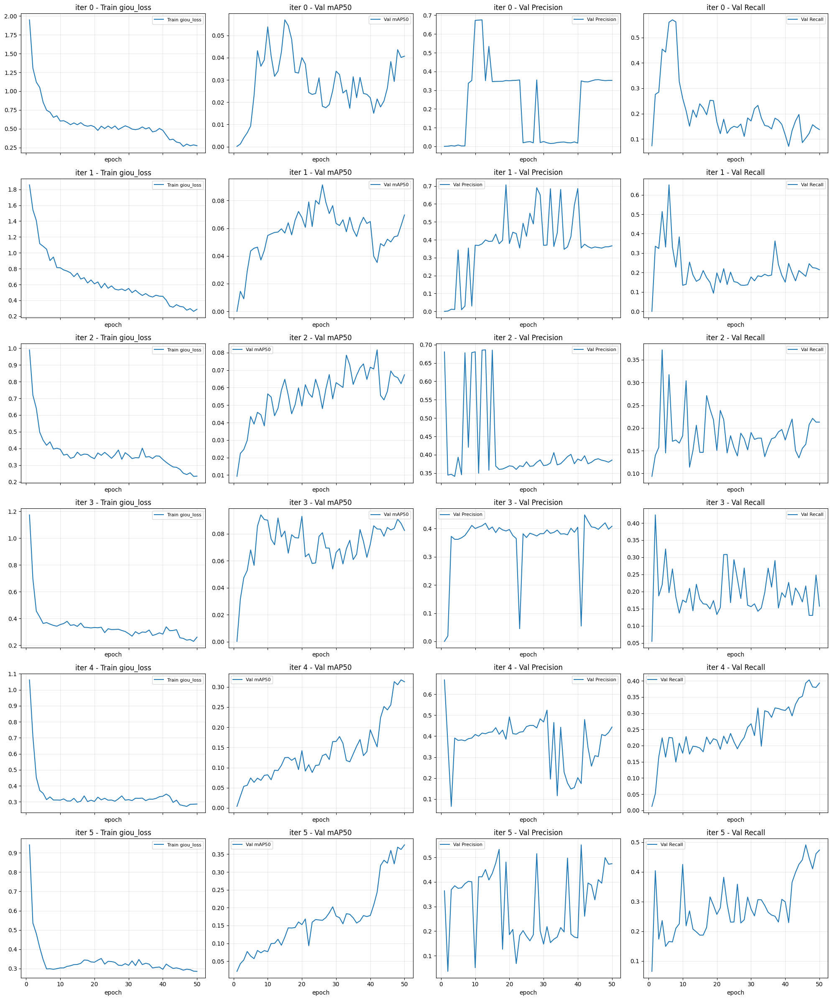

In [9]:
import matplotlib.pyplot as plt

metrics = [
    ('train/giou_loss', 'Train giou_loss'),
    ('metrics/mAP50(B)', 'Val mAP50'),
    ('metrics/precision(B)', 'Val Precision'),
    ('metrics/recall(B)', 'Val Recall'),
]
fig, axes = plt.subplots(6, 4, figsize=(20, 24), sharex=True)
for row, n in enumerate(range(6)):
    res_csv = Path(PROJECT_DIR) / f'{RUN}_iter{n}' / 'results.csv'
    for col, (m, lbl) in enumerate(metrics):
        ax = axes[row][col]
        if not res_csv.exists():
            ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
            ax.axis('off')
            continue
        df = pd.read_csv(res_csv)
        if m in df.columns:
            ax.plot(df['epoch'], df[m], label=lbl)
            ax.set_title(f'iter {n} - {lbl}')
            ax.set_xlabel('epoch')
            ax.legend(loc='best', fontsize=8)
            ax.grid(True, alpha=0.3)
        else:
            ax.text(0.5, 0.5, f'{m}\nnot in results.csv', ha='center', va='center', transform=ax.transAxes)
            ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_training_curves.png', dpi=120)
plt.show()


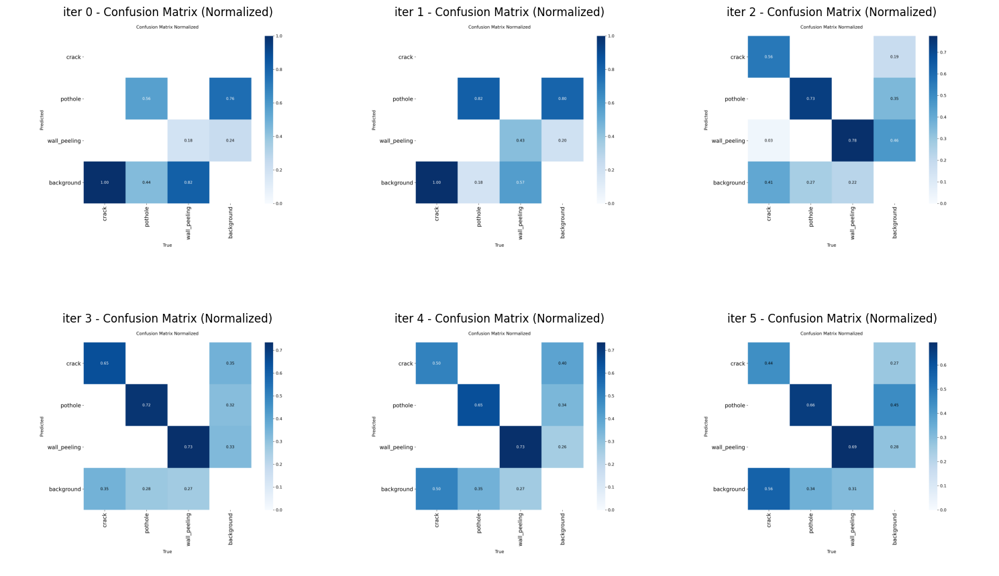

In [10]:
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for n in range(6):
    r, c = n // 3, n % 3
    ax = axes[r][c]
    p = Path(PROJECT_DIR) / f'{RUN}_iter{n}' / 'confusion_matrix_normalized.png'
    if p.exists():
        ax.imshow(mpimg.imread(p))
        ax.set_title(f'iter {n} - Confusion Matrix (Normalized)')
    else:
        ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
    ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_confusion_matrices.png', dpi=120)
plt.show()


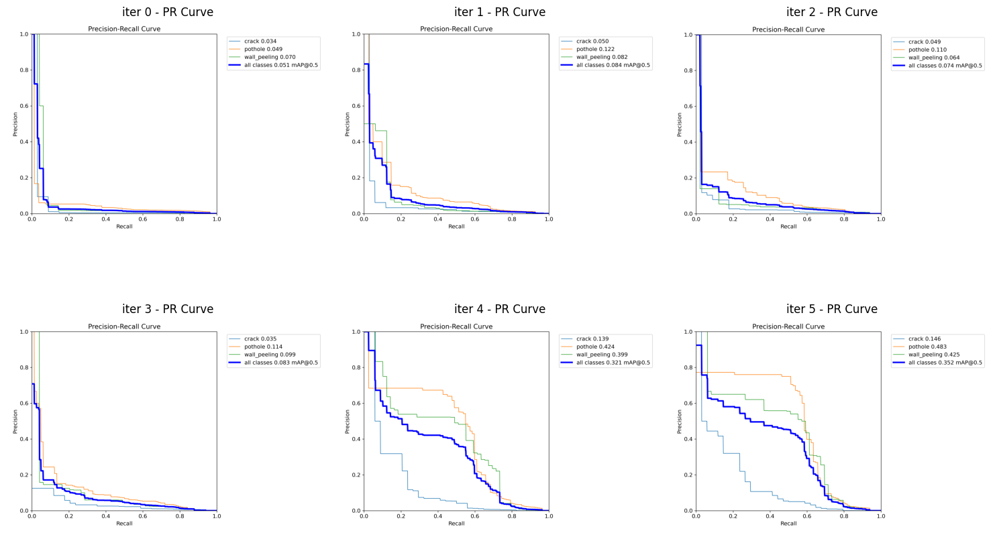

In [11]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for n in range(6):
    r, c = n // 3, n % 3
    ax = axes[r][c]
    p = Path(PROJECT_DIR) / f'{RUN}_iter{n}' / 'BoxPR_curve.png'
    if p.exists():
        ax.imshow(mpimg.imread(p))
        ax.set_title(f'iter {n} - PR Curve')
    else:
        ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
    ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_pr_curves.png', dpi=120)
plt.show()


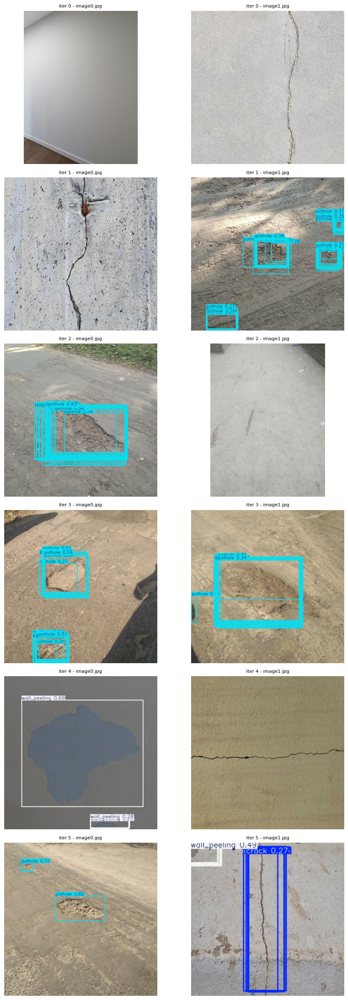

In [12]:
fig, axes = plt.subplots(6, 2, figsize=(10, 24))
for n in range(6):
    sample_dir = Path(PROJECT_DIR) / f'{RUN}_iter{n}_samples'
    samples = sorted(sample_dir.glob('*.jpg'))[:2] if sample_dir.exists() else []
    for col in range(2):
        ax = axes[n][col]
        if col < len(samples):
            ax.imshow(mpimg.imread(samples[col]))
            ax.set_title(f'iter {n} - {samples[col].name}', fontsize=8)
        else:
            ax.text(0.5, 0.5, f'iter {n}: no sample', ha='center', va='center', transform=ax.transAxes)
        ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_samples.png', dpi=120)
plt.show()


In [13]:
print('Per-class AP@50 across iters:')
header = f'{"class":<15}' + ''.join(f'iter{i}'.rjust(10) for i in range(6))
print(header)
for cls in CLASS_NAMES:
    row = [cls.ljust(15)]
    for n in range(6):
        summary = Path(PROJECT_DIR) / f'{RUN}_iter{n}_summary.json'
        if summary.exists():
            v = json.loads(summary.read_text(encoding='utf-8'))['per_class_ap50'].get(cls)
            row.append(f'{v:.4f}'.rjust(10) if v is not None else '--'.rjust(10))
        else:
            row.append('--'.rjust(10))
    print(''.join(row))


Per-class AP@50 across iters:
class               iter0     iter1     iter2     iter3     iter4     iter5
crack              0.0352    0.0498    0.0493    0.0338    0.1377    0.1659
pothole            0.0486    0.1187    0.1075    0.1159    0.4156    0.4878
wall_peeling       0.0639    0.1013    0.0645    0.0987    0.3958    0.4220


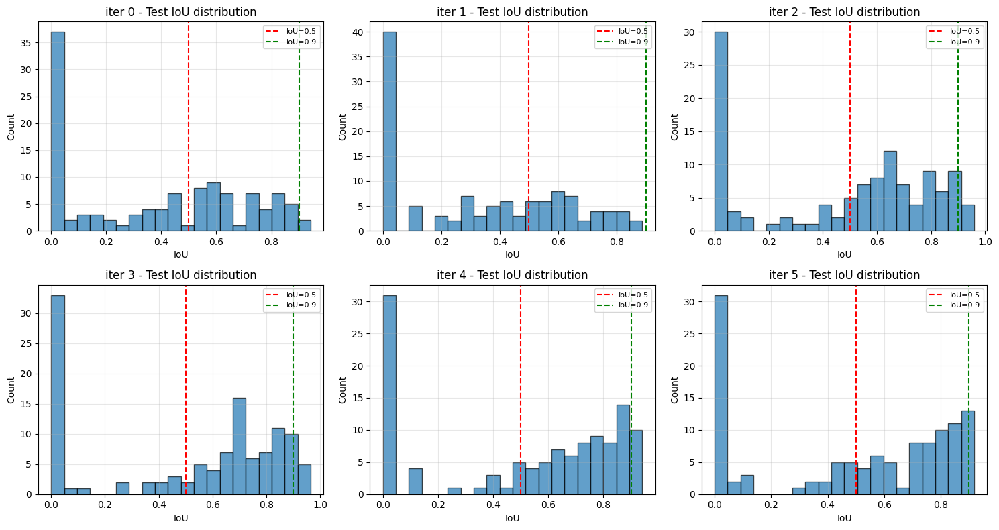

In [14]:
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for n in range(6):
    r, c = n // 3, n % 3
    ax = axes[r][c]
    iou_csv = Path(PROJECT_DIR) / f'{RUN}_iter{n}_test_iou.csv'
    if iou_csv.exists():
        df = pd.read_csv(iou_csv)
        ax.hist(df['iou'], bins=20, edgecolor='black', alpha=0.7)
        ax.set_title(f'iter {n} - Test IoU distribution')
        ax.set_xlabel('IoU')
        ax.set_ylabel('Count')
        ax.axvline(0.5, color='red', linestyle='--', label='IoU=0.5')
        ax.axvline(0.9, color='green', linestyle='--', label='IoU=0.9')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
    else:
        ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
        ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_iou_distribution.png', dpi=120)
plt.show()


## Final Model Evaluation — Best Iter


In [15]:
if BEST_WEIGHTS is None or not Path(BEST_WEIGHTS).exists():
    raise RuntimeError(f'Best iter weights not found: {BEST_WEIGHTS}. Run the iter loop first.')
print(f'Loading best iter weights: {BEST_WEIGHTS}')
trained_model = RTDETR(BEST_WEIGHTS)
print(f'Loaded model from iter {BEST_ITER} (run: {BEST_RUN_NAME})')


Loading best iter weights: /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter5/weights/best.pt
Loaded model from iter 5 (run: rtdetr_l_v6_iter5)


## Evaluation on Test Set

In [16]:
test_metrics = trained_model.val(
    data=DATASET_YAML,
    split='test',
    plots=True,
    project=PROJECT_DIR,
    name=f'{BEST_RUN_NAME}_test',
    exist_ok=True,
)

print("\n--- Test Metrics ---")
print(f"mAP@50:     {test_metrics.box.map50:.4f}")
print(f"mAP@50-95:  {test_metrics.box.map:.4f}")
print(f"Precision:  {test_metrics.box.mp:.4f}")
print(f"Recall:     {test_metrics.box.mr:.4f}")
print(f"\nPer-class AP@50:")
for i, name in enumerate(CLASS_NAMES):
    print(f"  {name}: {test_metrics.box.ap50[i]:.4f}")

Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 329.7±117.5 MB/s, size: 151.7 KB)
val: Scanning /home/achin/COS40007-Group/dataset/test/labels... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 1.6Kit/s 0.1s
val: New cache created: /home/achin/COS40007-Group/dataset/test/labels.cache


/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.3it/s 1.5s0.1s
                   all        117        148      0.472      0.419      0.314      0.164
                 crack         33         36      0.354      0.222      0.175     0.0361
               pothole         33         65      0.531      0.523      0.382      0.219
          wall_peeling         33         47      0.532      0.511      0.384      0.236
Speed: 1.1ms preprocess, 6.3ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v6_iter5_test

--- Test Metrics ---
mAP@50:     0.3137
mAP@50-95:  0.1635
Precision:  0.4723
Recall:     0.4186

Per-class AP@50:
  crack: 0.1750
  pothole: 0.3820
  wall_peeling: 0.3841


## Training Curves

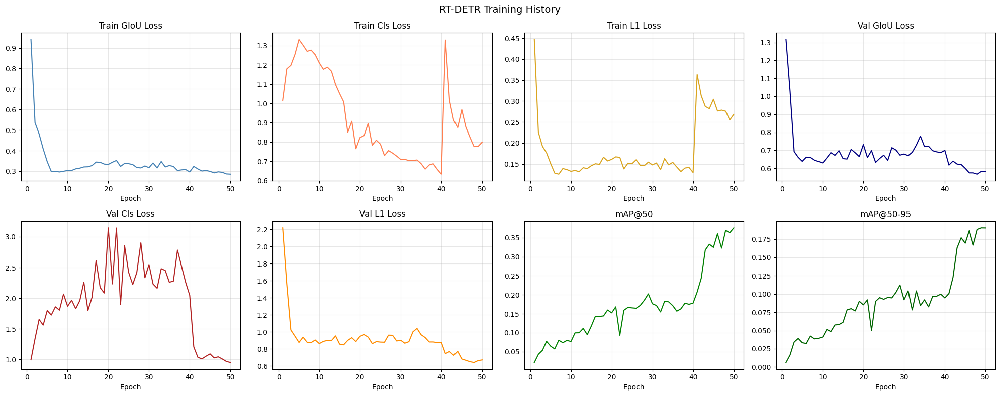

In [17]:
import pandas as pd
import matplotlib.image as mpimg

results_csv = os.path.join(PROJECT_DIR, BEST_RUN_NAME, 'results.csv')
df = pd.read_csv(results_csv)
df.columns = df.columns.str.strip()

plots = [
    ('train/giou_loss',       'Train GIoU Loss',  'steelblue'),
    ('train/cls_loss',        'Train Cls Loss',   'coral'),
    ('train/l1_loss',         'Train L1 Loss',    'goldenrod'),
    ('val/giou_loss',         'Val GIoU Loss',    'navy'),
    ('val/cls_loss',          'Val Cls Loss',     'firebrick'),
    ('val/l1_loss',           'Val L1 Loss',      'darkorange'),
    ('metrics/mAP50(B)',      'mAP@50',           'green'),
    ('metrics/mAP50-95(B)',   'mAP@50-95',        'darkgreen'),
    ('metrics/precision(B)',  'Precision',        'purple'),
    ('metrics/recall(B)',     'Recall',           'orange'),
    ('lr/pg0',                'LR (backbone)',    'gray'),
    ('lr/pg1',                'LR (weights)',     'darkgray'),
]

fig, axes = plt.subplots(2, 4, figsize=(20, 8))
for ax, (col, title, color) in zip(axes.flatten(), plots):
    if col in df.columns:
        ax.plot(df['epoch'], df[col], color=color, linewidth=1.5)
        ax.set_title(title)
        ax.set_xlabel('Epoch')
        ax.grid(True, alpha=0.3)
    else:
        ax.set_title(f'{title} (not found)')
        ax.axis('off')

plt.suptitle('RT-DETR Training History', fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(PROJECT_DIR, 'training_curves.png'), dpi=150)
plt.show()

## Inference and Visualisation on Test Images


image 1/117 /home/achin/COS40007-Group/dataset/test/images/crack-002.jpg: 640x640 1 wall_peeling, 22.5ms
image 2/117 /home/achin/COS40007-Group/dataset/test/images/crack-003.jpg: 640x640 2 cracks, 22.4ms
image 3/117 /home/achin/COS40007-Group/dataset/test/images/crack-008.jpg: 640x640 2 cracks, 24.6ms
image 4/117 /home/achin/COS40007-Group/dataset/test/images/crack-013.jpg: 640x640 (no detections), 20.8ms
image 5/117 /home/achin/COS40007-Group/dataset/test/images/crack-018.jpg: 640x640 1 crack, 20.1ms
image 6/117 /home/achin/COS40007-Group/dataset/test/images/crack-020.jpg: 640x640 (no detections), 19.9ms
image 7/117 /home/achin/COS40007-Group/dataset/test/images/crack-030.jpg: 640x640 3 cracks, 20.3ms
image 8/117 /home/achin/COS40007-Group/dataset/test/images/crack-033.jpg: 640x640 2 wall_peelings, 19.6ms
image 9/117 /home/achin/COS40007-Group/dataset/test/images/crack-039.jpg: 640x640 6 cracks, 8 wall_peelings, 19.6ms
image 10/117 /home/achin/COS40007-Group/dataset/test/images/crack

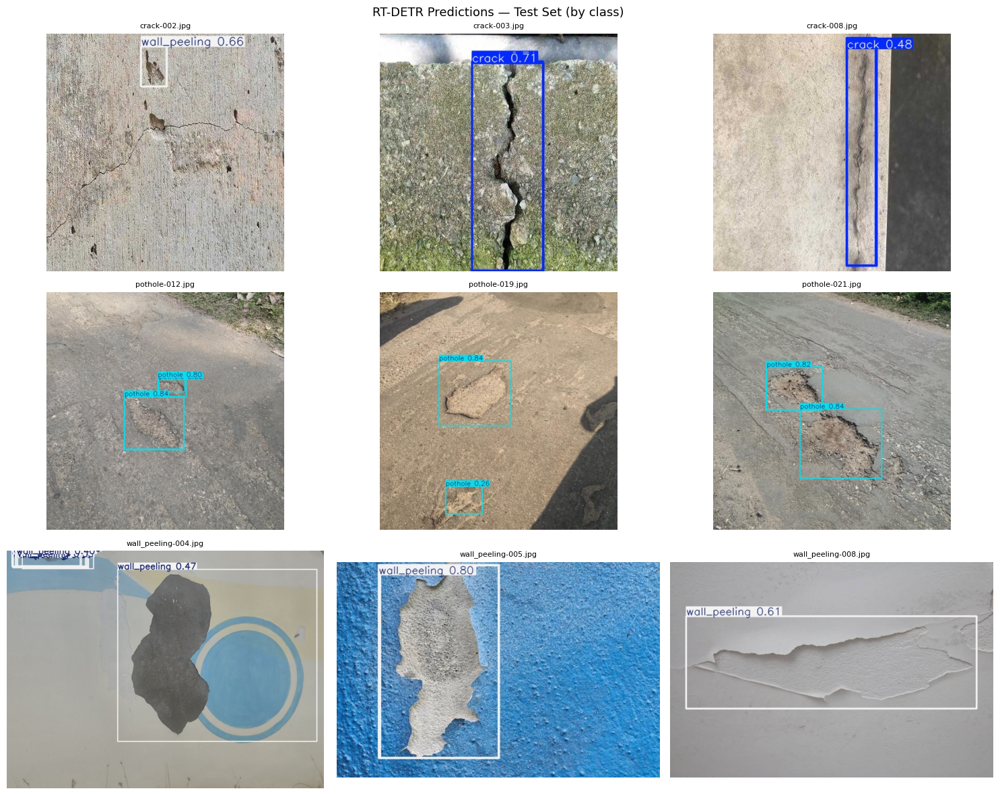

In [18]:
trained_model.predict(
    source=IMAGE_DIRS['test'],
    conf=0.25,
    iou=0.5,
    save=True,
    project=PROJECT_DIR,
    name=f'{BEST_RUN_NAME}_predictions',
    exist_ok=True,
)

pred_dir = Path(PROJECT_DIR) / f'{BEST_RUN_NAME}_predictions'

fig, axes = plt.subplots(NC, 3, figsize=(15, 4 * NC))
for row, cls_name in enumerate(CLASS_NAMES):
    cls_preds = sorted(pred_dir.glob(f'{cls_name}-*.jpg'))[:3]
    for col in range(3):
        ax = axes[row][col]
        ax.axis('off')
        if col < len(cls_preds):
            ax.imshow(mpimg.imread(cls_preds[col]))
            ax.set_title(cls_preds[col].name, fontsize=8)
        else:
            ax.set_title(f'{cls_name} — no prediction saved', fontsize=8)

plt.suptitle('RT-DETR Predictions — Test Set (by class)', fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(PROJECT_DIR, 'prediction_samples.png'), dpi=150)
plt.show()

## Display Evaluation Plots

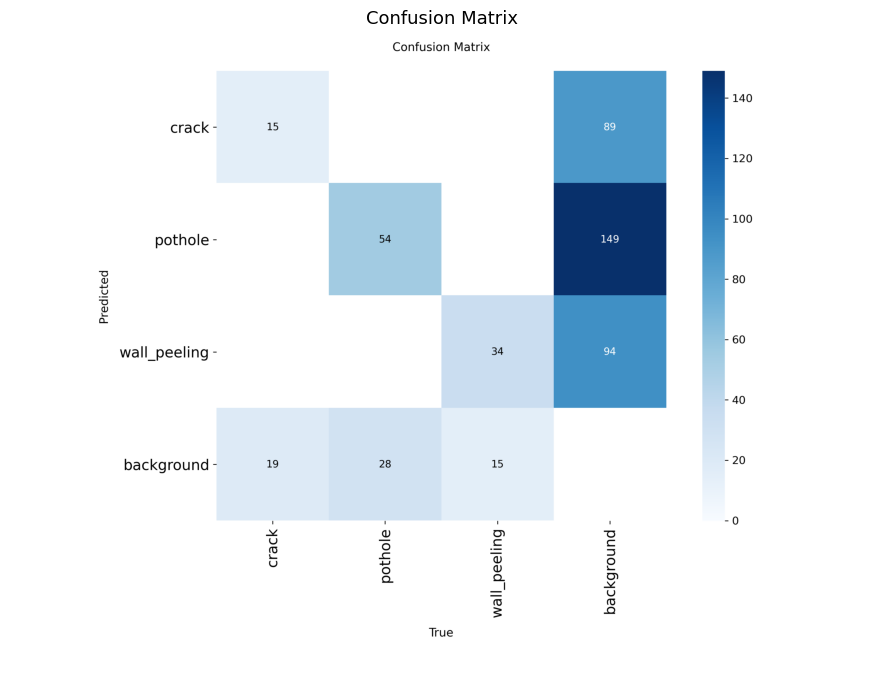

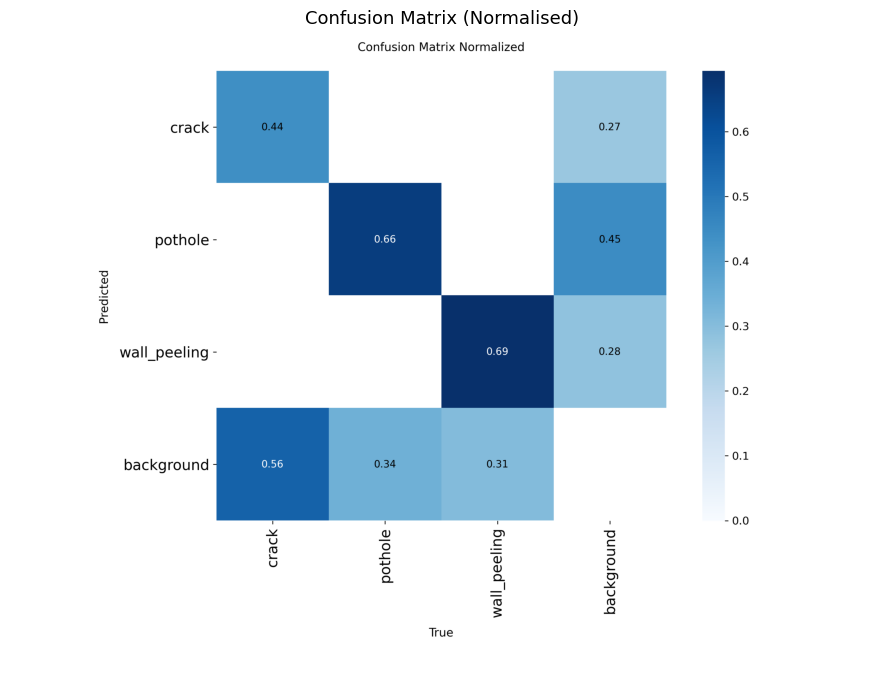

Not yet generated: PR_curve.png
Not yet generated: P_curve.png
Not yet generated: R_curve.png


In [19]:
eval_plots = [
    ('confusion_matrix.png',            'Confusion Matrix'),
    ('confusion_matrix_normalized.png', 'Confusion Matrix (Normalised)'),
    ('PR_curve.png',                    'Precision-Recall Curve'),
    ('P_curve.png',                     'Precision Curve'),
    ('R_curve.png',                     'Recall Curve'),
]

run_dir = Path(PROJECT_DIR) / BEST_RUN_NAME

for filename, title in eval_plots:
    p = run_dir / filename
    if p.exists():
        plt.figure(figsize=(10, 7))
        plt.imshow(mpimg.imread(p))
        plt.title(title, fontsize=13)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f"Not yet generated: {filename}")

## Inference Speed Benchmark

In [20]:
import time

test_imgs = list(Path(IMAGE_DIRS['test']).glob('*.jpg'))[:50]

# Warmup
trained_model.predict(source=[str(test_imgs[0])], conf=0.25, verbose=False)

# Timed run
start = time.time()
trained_model.predict(source=[str(p) for p in test_imgs], conf=0.25, verbose=False)
elapsed = time.time() - start

fps = len(test_imgs) / elapsed
print(f"Images tested : {len(test_imgs)}")
print(f"Total time    : {elapsed:.2f}s")
print(f"FPS           : {fps:.1f}")
print(f"ms/image      : {1000/fps:.1f}")

Images tested : 50
Total time    : 0.65s
FPS           : 77.3
ms/image      : 12.9


## Display Evaluation Plots

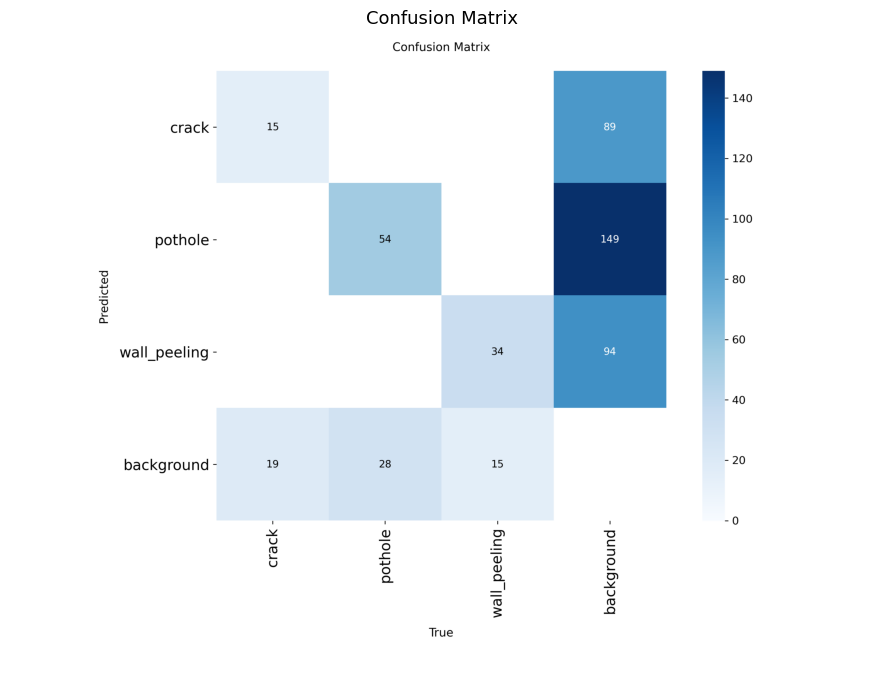

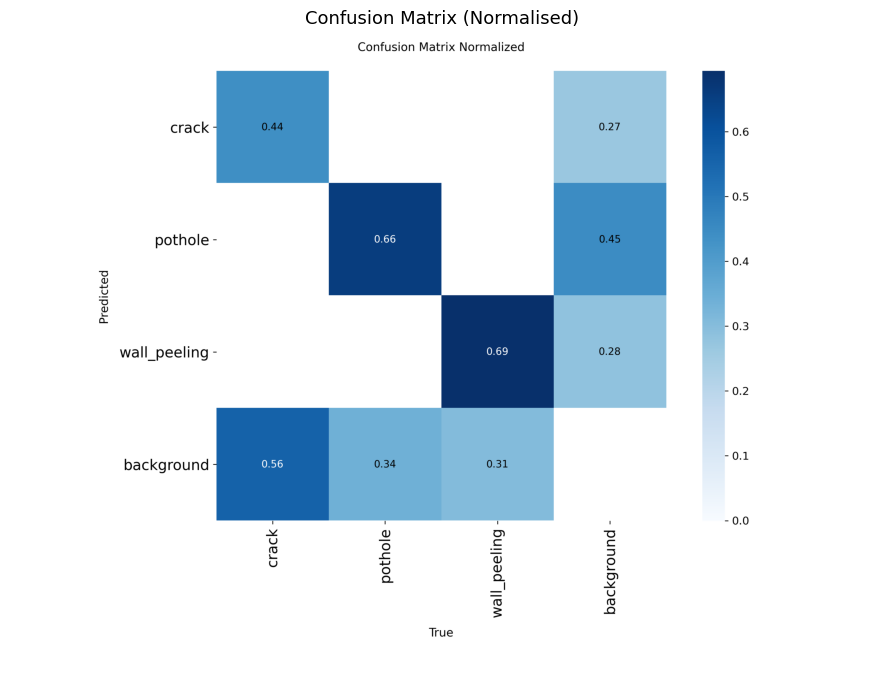

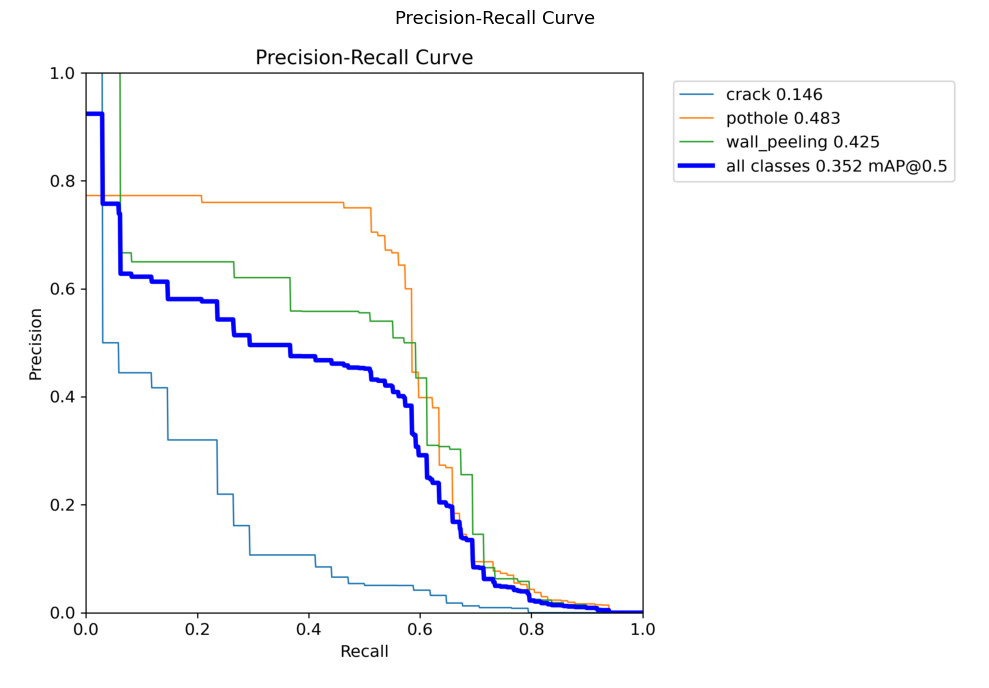

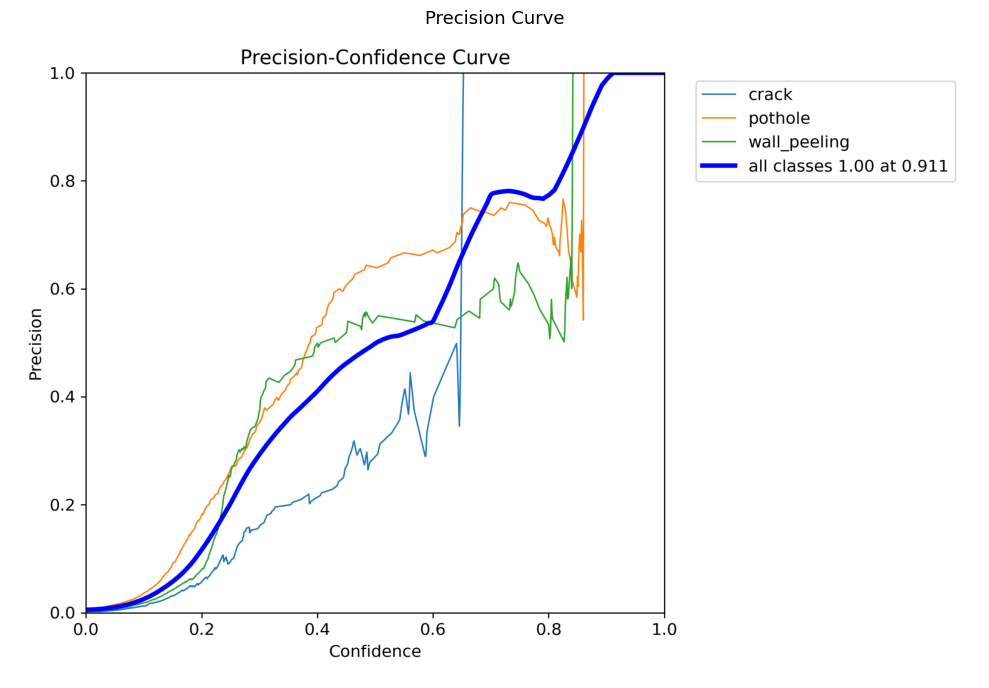

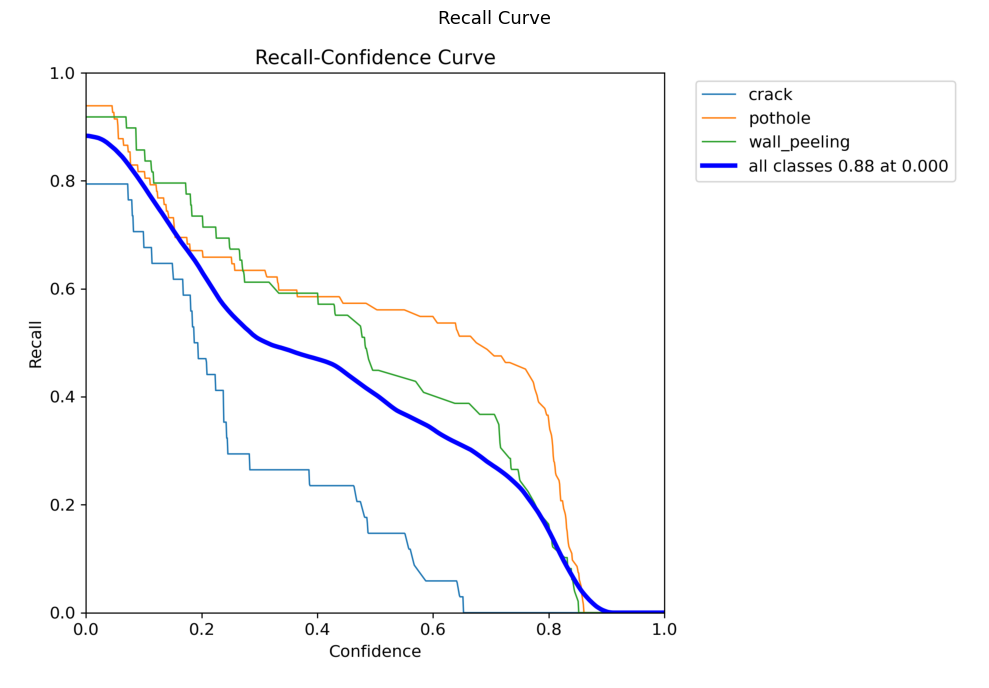

In [21]:
eval_plots = [
    ('confusion_matrix.png',            'Confusion Matrix'),
    ('confusion_matrix_normalized.png', 'Confusion Matrix (Normalised)'),
    ('BoxPR_curve.png',                    'Precision-Recall Curve'),
    ('BoxP_curve.png',                     'Precision Curve'),
    ('BoxR_curve.png',                     'Recall Curve'),
]

run_dir = Path(PROJECT_DIR) / BEST_RUN_NAME

for filename, title in eval_plots:
    p = run_dir / filename
    if p.exists():
        plt.figure(figsize=(10, 7))
        plt.imshow(mpimg.imread(p))
        plt.title(title, fontsize=13)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f"Not yet generated: {filename}")